# Brain extraction
Today we are going to extract some brains from their skulls! This will give us a chance to review many of the things we've covered in previous weeks, and I'll also try to point out some things to watch for.

Preliminaries: paths and definitions

In [1]:
mypirg = 'lcni' # your own pirg here

In [2]:
import pathlib

In [5]:
mypirgdir = pathlib.Path.home() / mypirg

That should be the same directory as /projects/{mypirg}/{myname}. If you have had an account on Talapas from before the standard directory structure existed, then that directory may not exist. You can contact them (https://hpcrcf.atlassian.net/servicedesk/customer/portal/1) and request that they create a directory for you there, or you can choose another directory under /projects/{mypirg}/shared. All work beyond simple scripts & notebooks should go in the project/{pirg} heirarchy. 

In [6]:
mypirgdir.exists()

True

In [10]:
# if you plan to use slurmpy
import sys
if '/projects/lcni/jolinda/shared/site-packages' not in sys.path:
    sys.path.append('/projects/lcni/jolinda/shared/site-packages')

In [12]:
# shared class directory
class_dir = pathlib.Path('/projects/lcni/jolinda/shared/TalapasClass')

In [13]:
# example input data set 1: open neuro
open_neuro_bids = class_dir / 'ds000114'

In [16]:
# example input data set 2: phantoms
phantom_bids = class_dir / 'bids_example'

# A few words about the data you are starting with
If you have collected an mprage on a Siemens scanner, you may have multiple series, some with an 'ND' in the series name. What does this mean? It means 'not distortion corrected'. Distortion correction is a post-processing step typically performed on the scanner for certain sequences. It's not the same as the field map correction we'll perform later on our echo planar images, but it is related. If you apply distortion correction, you have the option to also save the distorted images, which will have 'ND' in the series description. If there is no 'ND' in the name, the image may or may not have had distortion correction applied, and if it was applied, it could have been applied in 2D or 3D (I have not been able to find a difference between the two). Because it is a pos-processing step, you can take your images back to the scanner and remove or add distortion correction if you wish. How do you know for sure what was performed on your data? Look at the dicoms. Here's an example.

In [18]:
dicomdir = pathlib.Path('/projects/lcni/dcm/TalapasClass/Smith/TC/distortion_demo_20200526_130831/')

In [20]:
import os
sorted(os.listdir(dicomdir))

['Series_10_siemens_diff_3shell_ap',
 'Series_11_siemens_diff_3shell_pa',
 'Series_12_siemens_diff_3shell_rl',
 'Series_13_siemens_diff_3shell_lr',
 'Series_1_localizer',
 'Series_2_mprage_p2_ND',
 'Series_3_mprage_p2',
 'Series_4_bold_mb3_g2_2mm_te25',
 'Series_5_se_epi_mb3_g2_2mm_ap',
 'Series_6_se_epi_mb3_g2_2mm_pa',
 'Series_7_fieldmap_2mm',
 'Series_8_fieldmap_2mm',
 'Series_9_bold_mb6_2.5mm_tr780']

We have two mprage series in the set. Because one has 'ND', it's safe to assume the other has distortion correction applied, but how do we know for sure? The image type tag. Here's how to read it using pydicom. 

In [21]:
import pydicom

We can use pathlib.glob (or rglob, relative glob -- they'll do the same thing in this example) and next() to grab a random dicom file from each directory. This info will be the same for every file.

In [42]:
distorted_filename = next(dicomdir.glob('Series_2_*/*.dcm'))

In [43]:
corrected_filename = next(dicomdir.glob('Series_3_*/*.dcm'))

In [44]:
# did I do that right
distorted_filename

PosixPath('/projects/lcni/dcm/TalapasClass/Smith/TC/distortion_demo_20200526_130831/Series_2_mprage_p2_ND/MR.1.3.12.2.1107.5.2.19.45348.2020052613162436661501299.dcm')

pathlib is fairly new, so a lot of modules won't take pathlib.Path() objects - just convert to a string

In [47]:
distorted_dcm = pydicom.dcmread(str(distorted_filename))

In [50]:
# we already know this one because it's where our folder names come from
distorted_dcm.SeriesDescription

'mprage_p2_ND'

In [51]:
distorted_dcm.ImageType

['ORIGINAL', 'PRIMARY', 'M', 'ND', 'NORM']

In [52]:
corrected_dcm = pydicom.dcmread(str(corrected_filename))

In [53]:
corrected_dcm.ImageType

['ORIGINAL', 'PRIMARY', 'M', 'NORM', 'DIS3D', 'DIS2D']

What do this values mean?  The first two are required by the DICOM standard  
ORIGINAL: an image whose pixel values are based on original or source data  
Alternative is DERIVED  
PRIMARY: an image created as a direct result of the patient examination  
Alternative is SECONDARY  
The rest are modality and/or vendor specific.  
M: magnitude image  
NORM: normalized (in this case, prescan normalized)  
ND: no distortion correction  
DIS3D: 3d distortion correction  
DIS2D: 2d distortion correction  
We can display this for all of our series if we like:

In [55]:
for series in sorted(os.listdir(dicomdir)):
    print(series)
    filename = next(dicomdir.glob(series + '/*.dcm'))
    print(pydicom.dcmread(str(filename)).ImageType)

Series_10_siemens_diff_3shell_ap
['ORIGINAL', 'PRIMARY', 'DIFFUSION', 'NONE', 'ND', 'NORM', 'MOSAIC']
Series_11_siemens_diff_3shell_pa
['ORIGINAL', 'PRIMARY', 'DIFFUSION', 'NONE', 'ND', 'NORM', 'MOSAIC']
Series_12_siemens_diff_3shell_rl
['ORIGINAL', 'PRIMARY', 'DIFFUSION', 'NONE', 'ND', 'NORM', 'MOSAIC']
Series_13_siemens_diff_3shell_lr
['ORIGINAL', 'PRIMARY', 'DIFFUSION', 'NONE', 'ND', 'NORM', 'MOSAIC']
Series_1_localizer
['ORIGINAL', 'PRIMARY', 'M', 'ND', 'NORM']
Series_2_mprage_p2_ND
['ORIGINAL', 'PRIMARY', 'M', 'ND', 'NORM']
Series_3_mprage_p2
['ORIGINAL', 'PRIMARY', 'M', 'NORM', 'DIS3D', 'DIS2D']
Series_4_bold_mb3_g2_2mm_te25
['ORIGINAL', 'PRIMARY', 'M', 'MB', 'ND', 'NORM', 'MOSAIC']
Series_5_se_epi_mb3_g2_2mm_ap
['ORIGINAL', 'PRIMARY', 'M', 'ND', 'MOSAIC']
Series_6_se_epi_mb3_g2_2mm_pa
['ORIGINAL', 'PRIMARY', 'M', 'ND', 'MOSAIC']
Series_7_fieldmap_2mm
['ORIGINAL', 'PRIMARY', 'M', 'ND', 'NORM']
Series_8_fieldmap_2mm
['ORIGINAL', 'PRIMARY', 'P', 'ND']
Series_9_bold_mb6_2.5mm_tr780


Some other useful things in there are 'P' for phase (that's a phase difference image for fieldmap calculation), 'MB' for multiband, and 'MOSAIC'.

What is the effect of distortion correction on an mprage? Let's look at some images. Week 7 (Examining data) included some examples of how to view images in a notebook using matplotlib. But let's not get a random dicom this time, let's pick one near the middle. Let's hope that sorting the dicoms alphabetically puts them in the right order (there's no guarantee of that but it's the easiest approach).

In [59]:
distorted_filenames = sorted(dicomdir.glob('Series_2_*/*.dcm'))

In [61]:
len(distorted_filenames)

176

To get the middle image, just divide by two. A double slash in python means integer division.

In [62]:
middle_index = len(distorted_filenames) // 2

In [65]:
distorted_dcm = pydicom.dcmread(str(distorted_filenames[middle_index]))

In [66]:
corrected_filenames = sorted(dicomdir.glob('Series_3_*/*.dcm'))

In [67]:
corrected_dcm = pydicom.dcmread(str(corrected_filenames[middle_index]))

In [68]:
import matplotlib.pyplot as plt
import numpy as np

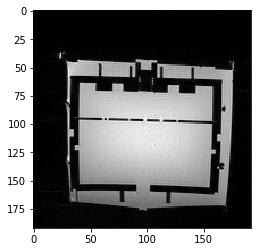

In [80]:
plt.imshow(distorted_dcm.pixel_array, cmap = 'gray')

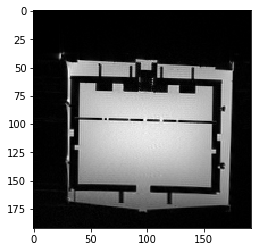

In [81]:
plt.imshow(corrected_dcm.pixel_array, cmap = 'gray')

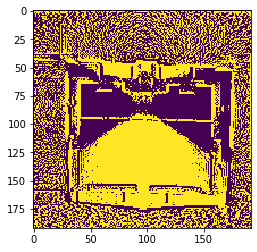

In [74]:
plt.imshow(corrected_dcm.pixel_array - distorted_dcm.pixel_array)

In [85]:
# let's get a random T1w from our open neuro dataset
t1w = next(open_neuro_bids.rglob('*T1w.nii.gz'))

In [86]:
t1w

PosixPath('/projects/lcni/jolinda/shared/TalapasClass/ds000114/sub-03/ses-test/anat/sub-03_ses-test_T1w.nii.gz')

We can plot this too! We just need to add a couple of things. One, if you remember this data, it has non-square voxels, so we'll need to adjust the image accordingly. You can get the voxel sizes from nibabel using 'get_zooms'. The other thing we have to do is rotate the image 90 degrees to get the familiar orientation (we didn't have to do that with the dicoms because of differences between nibabel and pydicom).

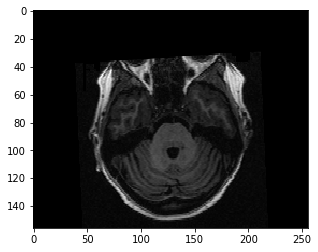

In [114]:
### import nibabel as nib
img = nib.load(str(t1w))
axial_slice = img.shape[2]//2
axial_aspect = img.header.get_zooms()[1]/img.header.get_zooms()[0]
plt.imshow(np.rot90(img.dataobj[:,:,axial_slice]), cmap = 'gray', aspect = axial_aspect)

We can pick a different slice, or another view

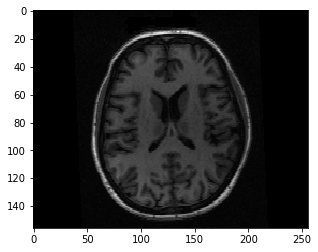

In [115]:
axial_slice = 170
plt.imshow(np.rot90(img.dataobj[:,:,axial_slice]), cmap = 'gray', aspect = axial_aspect)

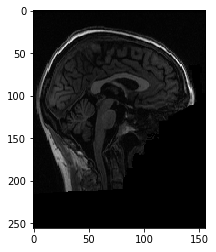

In [112]:
sagital_slice = img.shape[0]//2
sagital_aspect = img.header.get_zooms()[2]/img.header.get_zooms()[1]
plt.imshow(np.rot90(img.dataobj[sagital_slice, :, :]), cmap = 'gray', aspect = sagital_aspect)

That's really small and dark. We can use figsize to make the image bigger, and 'vmax' to set the maximum intensity of the image. We can also get rid of the numbers if we like.

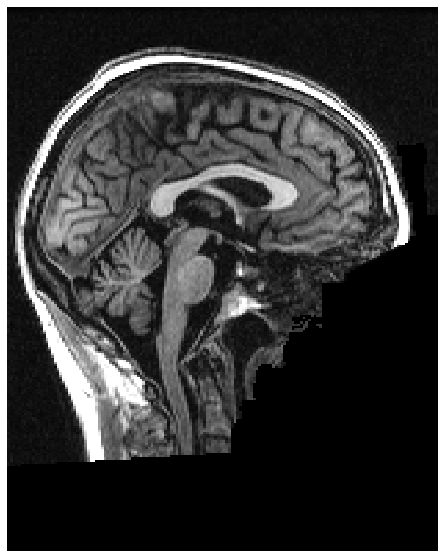

In [113]:
plt.figure(figsize = (10,10))
plt.imshow(np.rot90(img.dataobj[sagital_slice, :, :]), cmap = 'gray', aspect = sagital_aspect, vmax = 1000)
plt.axis('off')
plt.show()

You don't have to call plt.plot() every time, and you'll see I often don't. It's like the difference between just calling x and letting the notebook return and display the value, and explicitly calling print(x). We can get fancy and display multiple view at once.

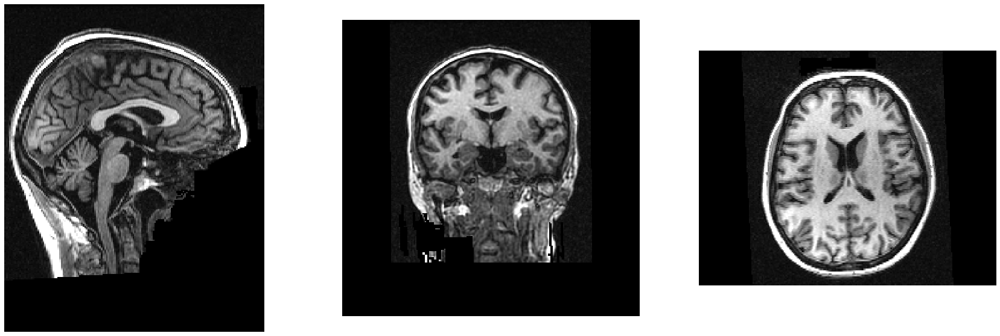

In [120]:
coronal_slice = img.shape[1]//2
coronal_aspect = img.header.get_zooms()[2]/img.header.get_zooms()[0]

fig, axs = plt.subplots(1, 3, figsize=(30,10))
axs[0].imshow(np.rot90(img.dataobj[sagital_slice,:,:]), cmap = 'gray', aspect = sagital_aspect, vmax = 1000)
axs[1].imshow(np.rot90(img.dataobj[:,coronal_slice,:]), cmap = 'gray', aspect = coronal_aspect, vmax = 1000)
axs[2].imshow(np.rot90(img.dataobj[:,:,axial_slice]), cmap = 'gray', aspect = axial_aspect, vmax = 1000)
axs[0].axis('off')
axs[1].axis('off')
axs[2].axis('off')
plt.show()

# Brain extraction using FSL's BET
First of all, there are two other commands you might wish to use before running bet. The first is 'fslreorient2std'. This will reorient your nifti file to an 'axial' orientation. This may not be necessary if your data was converted to nifti using dcm2niix, which will do this during conversion. If it was converted another way, I highly recommend running this first -- your registration step will thank me later. The second step is "robustfov". This will get rid of the lower head & neck in your image. This improves bet's performance and reduces the file size so things will run faster.

In [127]:
%%bash --no-raise-error
module load fsl/6.0.1
bet


Usage:    bet <input> <output> [options]

Main bet2 options:
  -o          generate brain surface outline overlaid onto original image
  -m          generate binary brain mask
  -s          generate approximate skull image
  -n          don't generate segmented brain image output
  -f <f>      fractional intensity threshold (0->1); default=0.5; smaller values give larger brain outline estimates
  -g <g>      vertical gradient in fractional intensity threshold (-1->1); default=0; positive values give larger brain outline at bottom, smaller at top
  -r <r>      head radius (mm not voxels); initial surface sphere is set to half of this
  -c <x y z>  centre-of-gravity (voxels not mm) of initial mesh surface.
  -t          apply thresholding to segmented brain image and mask
  -e          generates brain surface as mesh in .vtk format

Variations on default bet2 functionality (mutually exclusive options):
  (default)   just run bet2
  -R          robust brain centre estimation (iterates BE

We'll explore some of these options -- I like to always add -o as a way to check the results.

In [123]:
# make an output directory
outputdir = mypirgdir / 'class9out'

In [124]:
outputdir.mkdir()

We could submit to slurm but this shouldn't take too long. Remember how to pass arguments to a bash magic shell? I like to use echo first to make sure I did it right. First let's try bet with no arguments except -o, just an output.

In [128]:
%%bash -s {str(t1w)} {str(outputdir)}
module load fsl/6.0.1
echo bet $1 $2/betted -o

bet /projects/lcni/jolinda/shared/TalapasClass/ds000114/sub-03/ses-test/anat/sub-03_ses-test_T1w.nii.gz /home/jolinda/lcni/class9out/betted -o


In [129]:
%%bash -s {str(t1w)} {str(outputdir)}
module load fsl/6.0.1
bet $1 $2/betted -o

In [130]:
os.listdir(outputdir)

['betted_overlay.nii.gz', 'betted.nii.gz']

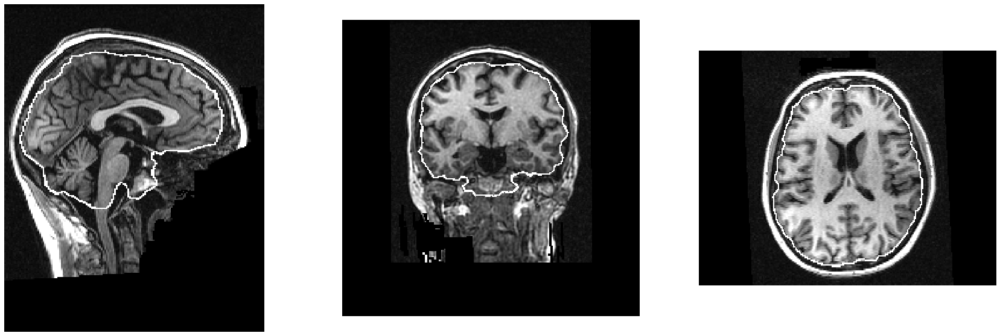

In [131]:
# We can cut and past our old code and just change the input image
img = nib.load(str(outputdir / 'betted_overlay.nii.gz'))

fig, axs = plt.subplots(1, 3, figsize=(30,10))
axs[0].imshow(np.rot90(img.dataobj[sagital_slice,:,:]), cmap = 'gray', aspect = sagital_aspect, vmax = 1000)
axs[1].imshow(np.rot90(img.dataobj[:,coronal_slice,:]), cmap = 'gray', aspect = coronal_aspect, vmax = 1000)
axs[2].imshow(np.rot90(img.dataobj[:,:,axial_slice]), cmap = 'gray', aspect = axial_aspect, vmax = 1000)
axs[0].axis('off')
axs[1].axis('off')
axs[2].axis('off')
plt.show()

That worked pretty well, but I want to share some examples where things didn't go so well and what I did about it. Unfortunately I can't share the actual nifti files, but I can show some images here.

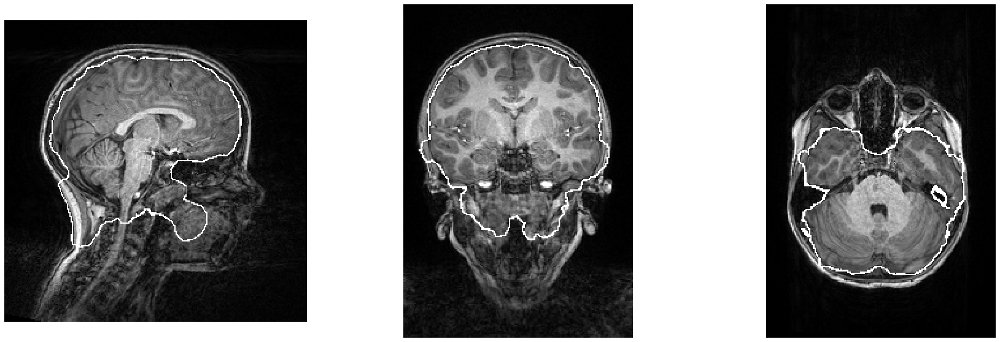

In [137]:
img = nib.load(str(outputdir / 'kid_bet2_overlay.nii.gz'))
sagital_slice = img.shape[0]//2
coronal_slice = img.shape[1]//2
axial_slice = img.shape[2]//2

fig, axs = plt.subplots(1, 3, figsize=(30,10))
axs[0].imshow(np.rot90(img.dataobj[sagital_slice,:,:]), cmap = 'gray', vmax = 300)
axs[1].imshow(np.rot90(img.dataobj[:,coronal_slice,:]), cmap = 'gray', vmax = 00)
axs[2].imshow(np.rot90(img.dataobj[:,:,axial_slice]), cmap = 'gray', vmax = 500)
axs[0].axis('off')
axs[1].axis('off')
axs[2].axis('off')
plt.show()

In [146]:
%%bash -s {str(example_kid)} {str(outputdir)}
module load fsl/6.0.1
fslreorient2std $1 $2/kid
robustfov -i $2/kid -r $2/kid_rob
bet $2/kid_rob $2/kid_rob_bet -o

Final FOV is: 
0.000000 176.000000 0.000000 256.000000 65.000000 170.000000 



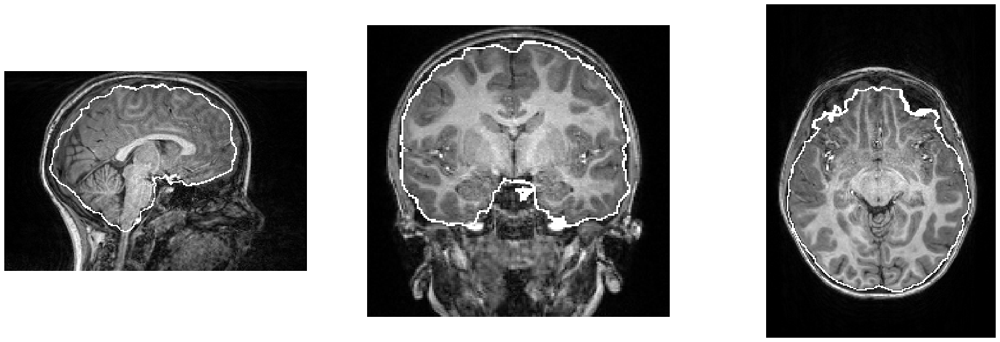

In [147]:
img = nib.load(str(outputdir / 'kid_rob_bet_overlay.nii.gz'))
sagital_slice = img.shape[0]//2
coronal_slice = img.shape[1]//2
axial_slice = img.shape[2]//2

fig, axs = plt.subplots(1, 3, figsize=(30,10))
axs[0].imshow(np.rot90(img.dataobj[sagital_slice,:,:]), cmap = 'gray', vmax = 300)
axs[1].imshow(np.rot90(img.dataobj[:,coronal_slice,:]), cmap = 'gray', vmax = 300)
axs[2].imshow(np.rot90(img.dataobj[:,:,axial_slice]), cmap = 'gray', vmax = 300)
axs[0].axis('off')
axs[1].axis('off')
axs[2].axis('off')
plt.show()

In [152]:
somelist = ['a', 'b', 'c', 'd']
for thing in somelist:
    print(thing)

a
b
c
d


In [153]:
for index, thing in enumerate(somelist):
    print(index, thing)

0 a
1 b
2 c
3 d


In [154]:
# it's equivalent to this:
for index in range(0, len(somelist)):
    print(index, somelist[index])

0 a
1 b
2 c
3 d


In [148]:
img.shape

(176, 256, 170)

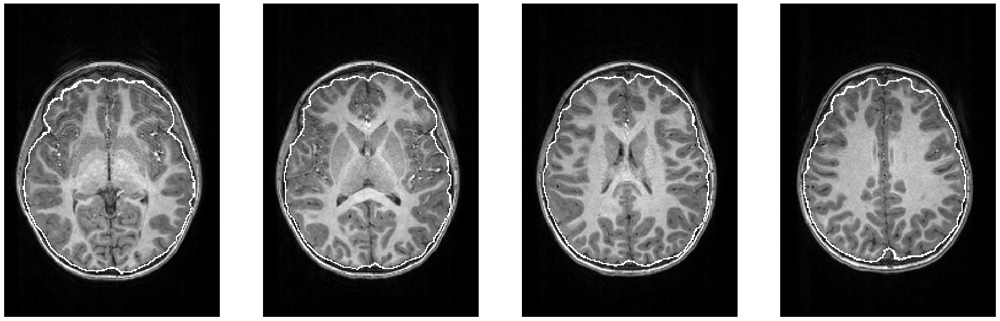

In [151]:
img = nib.load(str(outputdir / 'kid_rob_bet_overlay.nii.gz'))
slices = [90,100,110,120]
fig, axs = plt.subplots(1, 4, figsize=(30,10))
for i,s in enumerate(slices):
    axs[i].imshow(np.rot90(img.dataobj[:,:,s]), cmap = 'gray', vmax = 300)
    axs[i].axis('off')
plt.show()

It's not terrible but you can see the front part of the brain has been cut off a bit. Do any bet parameters help? 'f' says it gives a larger brain outline, we can try that.

In [155]:
%%bash -s {str(outputdir)}
module load fsl/6.0.1
bet $1/kid_rob $1/kid_rob_bet_f -o -f 0.4

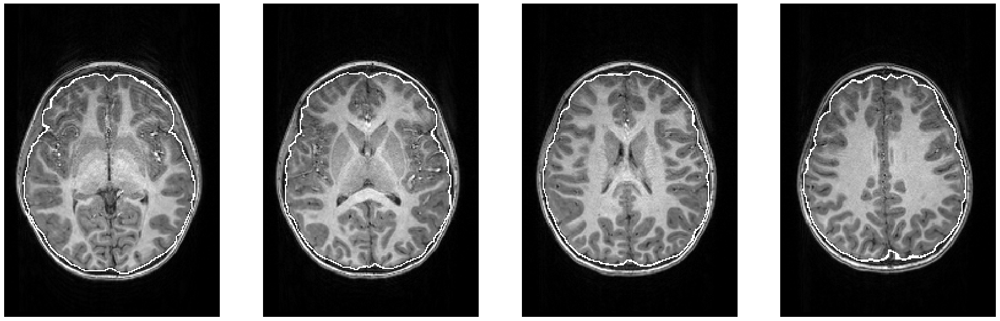

In [157]:
img = nib.load(str(outputdir / 'kid_rob_bet_f_overlay.nii.gz'))
fig, axs = plt.subplots(1, 4, figsize=(30,10))
for i,s in enumerate(slices):
    axs[i].imshow(np.rot90(img.dataobj[:,:,s]), cmap = 'gray', vmax = 300)
    axs[i].axis('off')
plt.show()

I promised a secret trick for brain extraction in kids. What I've found is that often the brain outline needs to be expanded in the front, but not in the back. Bet has a 'g' option you can play with, but only in the z direction, so to use it this way have to do flip your axes around, and then back, like this:
```
fslswapdim mprage x z y temp
bet temp temp_brain -R -o -f 0.4 -g -0.1
fslswapdim temp_brain x z y mprage_brain
fslswapdim temp_overlay x z y mprage_brain_overlay
rm temp*
```

# Example: slurm array for bet using slurmpy
Step one: find the files that need to be betted

The very important step I'm not showing you: look at your data & organize it. Are some of your subjects named prj001 and others PRJ.0002? Do some have multiple mprages? Are you absolutely sure your longitudinal runs are from the same people (more on that later)? This is the time to fix that sort of thing. If you've converted using my tools and you have run numbers in your file names, you might want to remove those at this stage to make scripting easier. We'll just assume that the tedious bit has already been done.

In [176]:
all_anats = sorted(open_neuro_bids.rglob('*T1w.nii.gz'))

In [177]:
all_anats

[PosixPath('/projects/lcni/jolinda/shared/TalapasClass/ds000114/sub-01/ses-retest/anat/sub-01_ses-retest_T1w.nii.gz'),
 PosixPath('/projects/lcni/jolinda/shared/TalapasClass/ds000114/sub-01/ses-test/anat/sub-01_ses-test_T1w.nii.gz'),
 PosixPath('/projects/lcni/jolinda/shared/TalapasClass/ds000114/sub-02/ses-retest/anat/sub-02_ses-retest_T1w.nii.gz'),
 PosixPath('/projects/lcni/jolinda/shared/TalapasClass/ds000114/sub-02/ses-test/anat/sub-02_ses-test_T1w.nii.gz'),
 PosixPath('/projects/lcni/jolinda/shared/TalapasClass/ds000114/sub-03/ses-retest/anat/sub-03_ses-retest_T1w.nii.gz'),
 PosixPath('/projects/lcni/jolinda/shared/TalapasClass/ds000114/sub-03/ses-test/anat/sub-03_ses-test_T1w.nii.gz'),
 PosixPath('/projects/lcni/jolinda/shared/TalapasClass/ds000114/sub-04/ses-retest/anat/sub-04_ses-retest_T1w.nii.gz'),
 PosixPath('/projects/lcni/jolinda/shared/TalapasClass/ds000114/sub-04/ses-test/anat/sub-04_ses-test_T1w.nii.gz'),
 PosixPath('/projects/lcni/jolinda/shared/TalapasClass/ds000114/

The next step is to decide what the output file names should be. One option is to keep them in bids-compatible format but I'm going to take an easier route and append "brain" and "brain_overlay" to the end. Now we need a list of subject names.

In [185]:
os.listdir(open_neuro_bids)

['task-overtwordrepetition_bold.json',
 'sub-03',
 'sub-08',
 'task-fingerfootlips_events.tsv',
 'task-covertverbgeneration_bold.json',
 'sub-02',
 'sub-07',
 'task-linebisection_bold.json',
 'task-covertverbgeneration_events.tsv',
 'sub-01',
 'sub-06',
 'task-overtverbgeneration_bold.json',
 'sub-05',
 'participants.tsv',
 'dataset_description.json',
 'sub-04',
 'sub-09',
 'task-overtverbgeneration_events.tsv',
 'dwi.bval',
 'sub-10',
 'task-fingerfootlips_bold.json',
 'dwi.bvec',
 'task-overtwordrepetition_events.tsv',
 'CHANGES']

In [186]:
subject_names = [x for x in os.listdir(open_neuro_bids) if 'sub' in x]

In [187]:
subject_names

['sub-03',
 'sub-08',
 'sub-02',
 'sub-07',
 'sub-01',
 'sub-06',
 'sub-05',
 'sub-04',
 'sub-09',
 'sub-10']

That can be our array for the slurm job. File names are `${x}_ses-test_T1w` or `${x}_ses-retest_T1w`

In [189]:
import slurmpy
sj = slurmpy.SlurmJob()
sj.account = mypirg
sj.command = list()
sj.command.append('module load fsl/6.0.1')
sj.command.append('bet {}/${{x}}/ses-test/anat/${{x}}_ses-test_T1w {}/${{x}}_ses-test_T1w_brain -o -R'.format(open_neuro_bids, outputdir))
sj.command.append('bet {}/${{x}}/ses-retest/anat/${{x}}_ses-retest_T1w {}/${{x}}_ses-retest_T1w_brain -o -R'.format(open_neuro_bids, outputdir))
sj.jobname = 'bet'
sj.array = subject_names
sj.WriteSlurmFile()
sj.PrintSlurmFile()

#!/bin/bash
#SBATCH --job-name=bet
#SBATCH --account=lcni
#SBATCH --array=0-9

data=(sub-03 sub-08 sub-02 sub-07 sub-01 sub-06 sub-05 sub-04 sub-09 sub-10)

x=${data[$SLURM_ARRAY_TASK_ID]}


module load fsl/6.0.1
bet /projects/lcni/jolinda/shared/TalapasClass/ds000114/${x}/ses-test/anat/${x}_ses-test_T1w /home/jolinda/lcni/class9out/${x}_ses-test_T1w_brain -o -R
bet /projects/lcni/jolinda/shared/TalapasClass/ds000114/${x}/ses-retest/anat/${x}_ses-retest_T1w /home/jolinda/lcni/class9out/${x}_ses-retest_T1w_brain -o -R


In [190]:
sj.SubmitSlurmFile()

Submitted batch job 12049386



'12049386'

In [237]:
sj.ShowStatus()

COMPLETED 10


In [239]:
ls {outputdir}/sub*

/home/jolinda/lcni/class9out/sub-01_ses-retest_T1w_brain.nii.gz
/home/jolinda/lcni/class9out/sub-01_ses-retest_T1w_brain_overlay.nii.gz
/home/jolinda/lcni/class9out/sub-01_ses-test_T1w_brain.nii.gz
/home/jolinda/lcni/class9out/sub-01_ses-test_T1w_brain_overlay.nii.gz
/home/jolinda/lcni/class9out/sub-02_ses-retest_T1w_brain.nii.gz
/home/jolinda/lcni/class9out/sub-02_ses-retest_T1w_brain_overlay.nii.gz
/home/jolinda/lcni/class9out/sub-02_ses-test_T1w_brain.nii.gz
/home/jolinda/lcni/class9out/sub-02_ses-test_T1w_brain_overlay.nii.gz
/home/jolinda/lcni/class9out/sub-03_ses-retest_T1w_brain.nii.gz
/home/jolinda/lcni/class9out/sub-03_ses-retest_T1w_brain_overlay.nii.gz
/home/jolinda/lcni/class9out/sub-03_ses-test_T1w_brain.nii.gz
/home/jolinda/lcni/class9out/sub-03_ses-test_T1w_brain_overlay.nii.gz
/home/jolinda/lcni/class9out/sub-04_ses-retest_T1w_brain.nii.gz
/home/jolinda/lcni/class9out/sub-04_ses-retest_T1w_brain_overlay.nii.gz
/home/jolinda/lcni/class9out/sub-04_ses-test_T1w_brain.nii.g

sub-01_ses-retest_T1w_brain_overlay.nii.gz


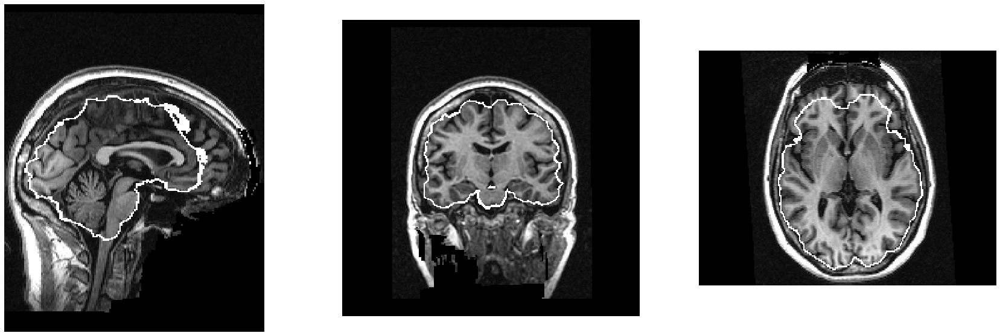

sub-01_ses-test_T1w_brain_overlay.nii.gz


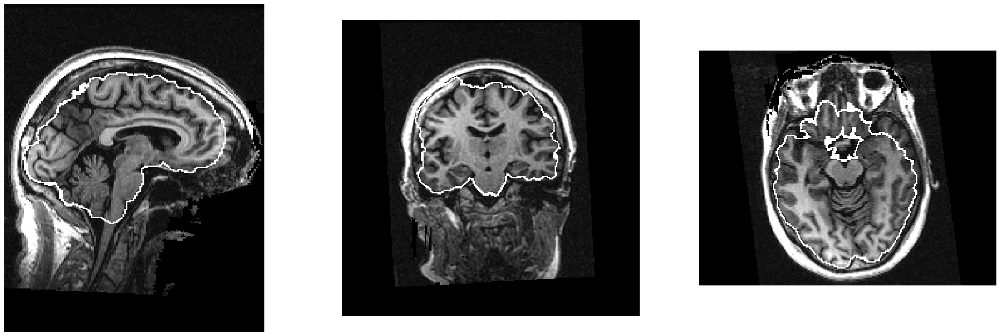

sub-02_ses-retest_T1w_brain_overlay.nii.gz


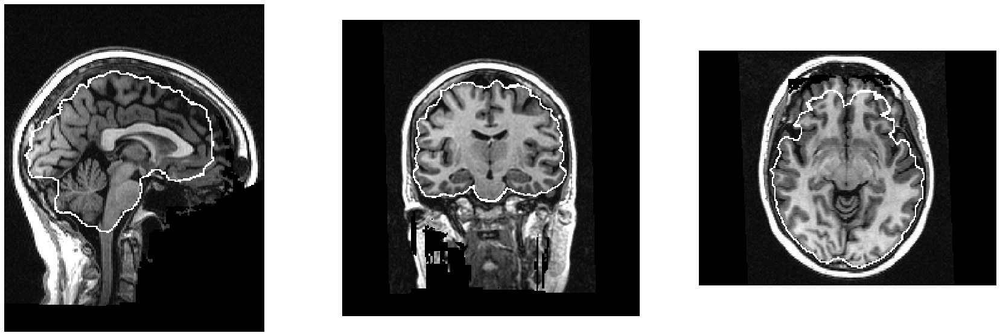

sub-02_ses-test_T1w_brain_overlay.nii.gz


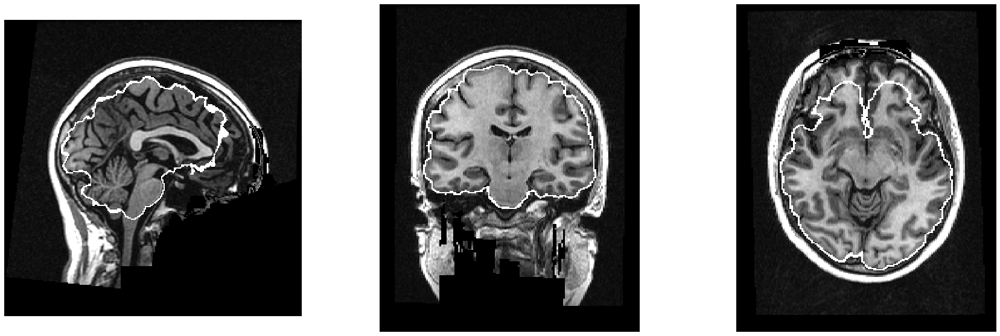

sub-03_ses-retest_T1w_brain_overlay.nii.gz


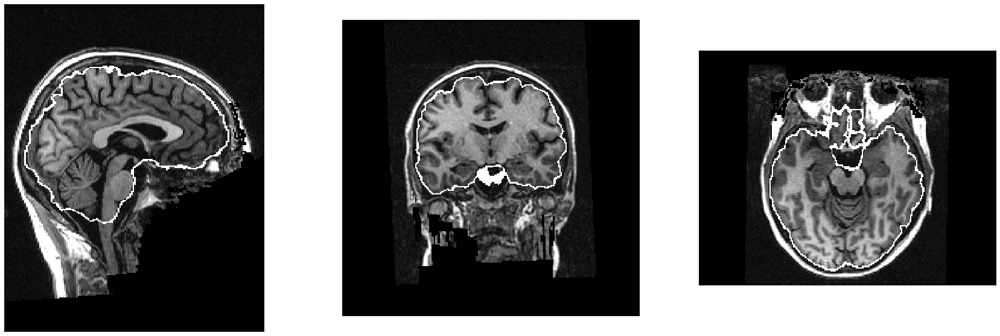

sub-03_ses-test_T1w_brain_overlay.nii.gz


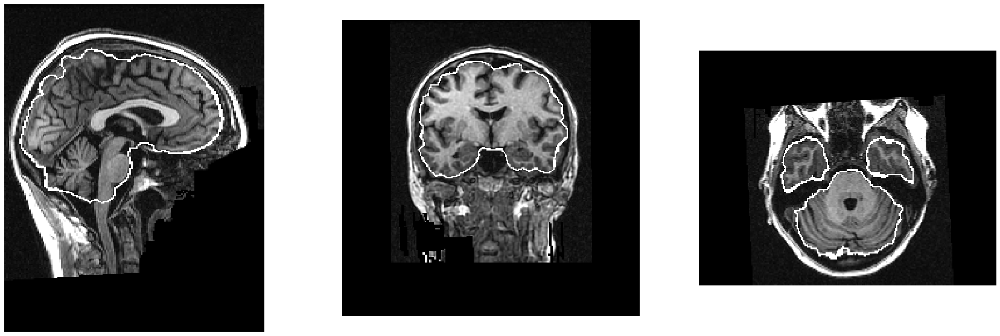

sub-04_ses-retest_T1w_brain_overlay.nii.gz


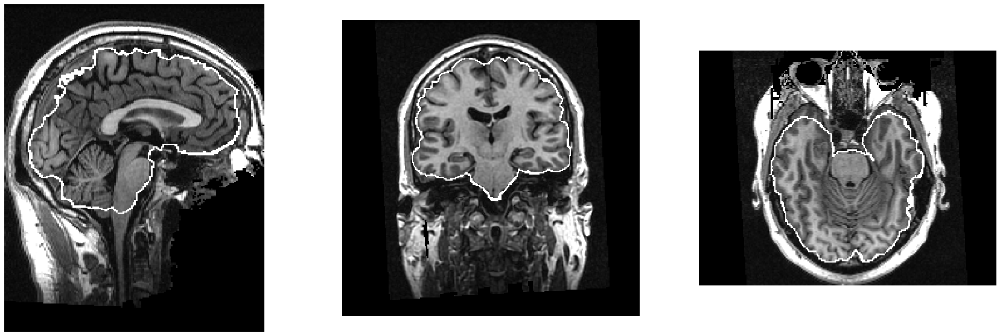

sub-04_ses-test_T1w_brain_overlay.nii.gz


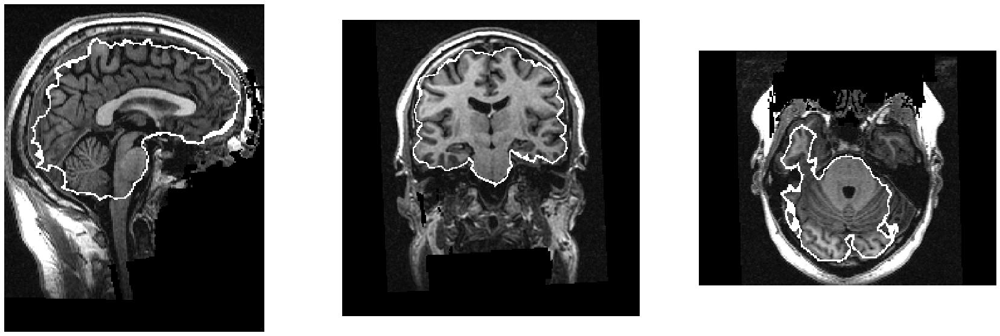

sub-05_ses-retest_T1w_brain_overlay.nii.gz


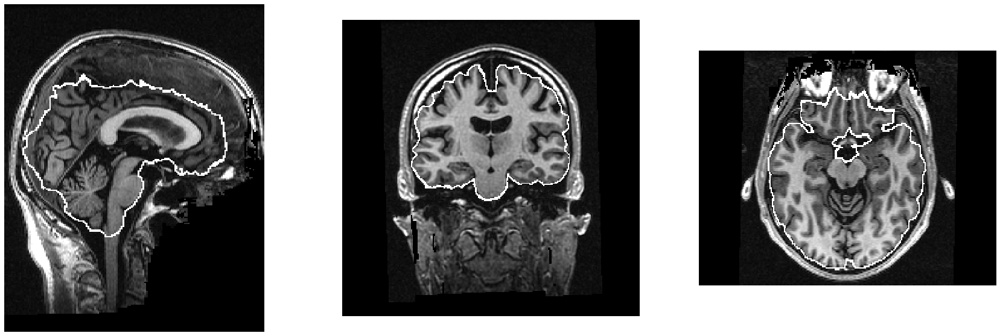

sub-05_ses-test_T1w_brain_overlay.nii.gz


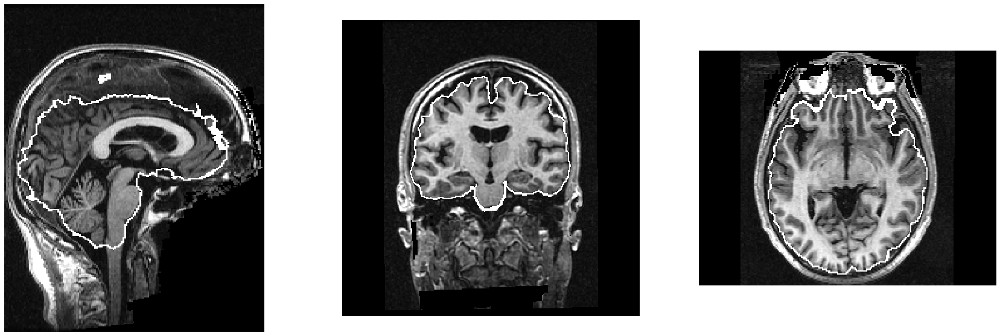

sub-06_ses-retest_T1w_brain_overlay.nii.gz


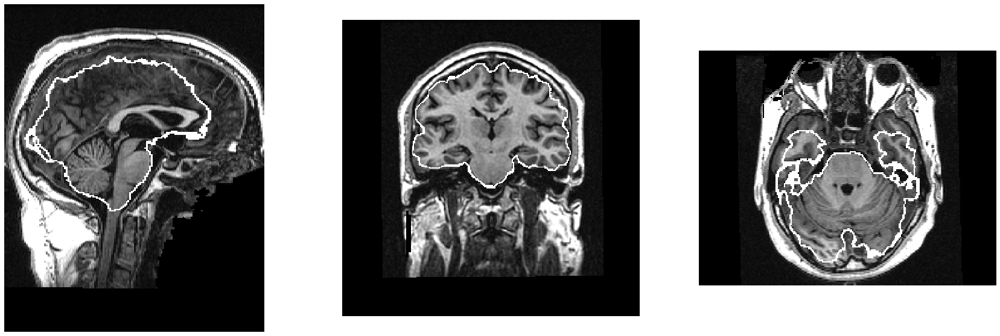

sub-06_ses-test_T1w_brain_overlay.nii.gz


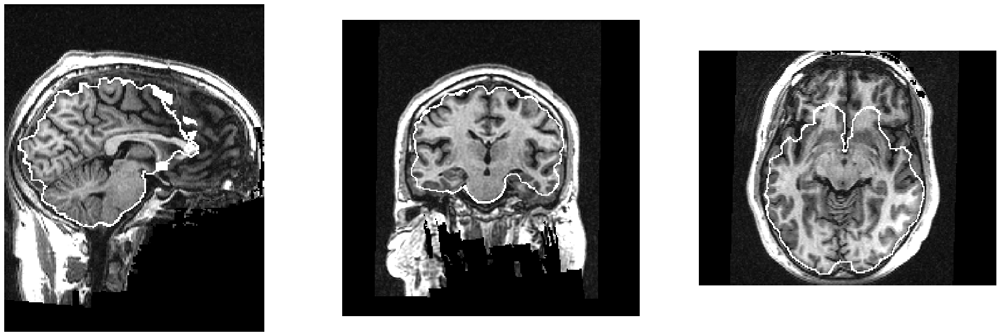

sub-07_ses-retest_T1w_brain_overlay.nii.gz


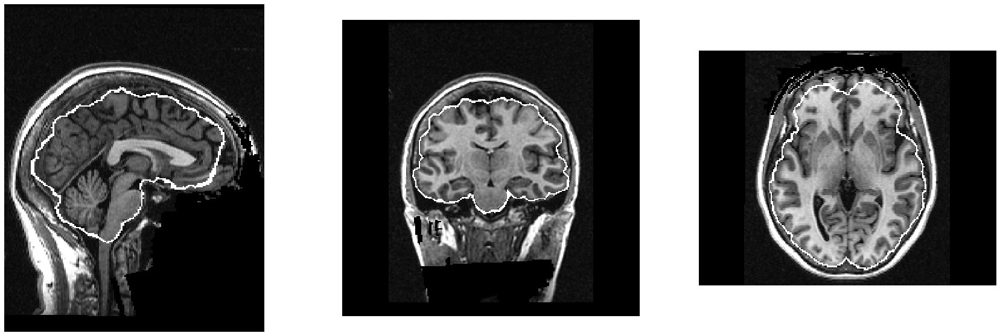

sub-07_ses-test_T1w_brain_overlay.nii.gz


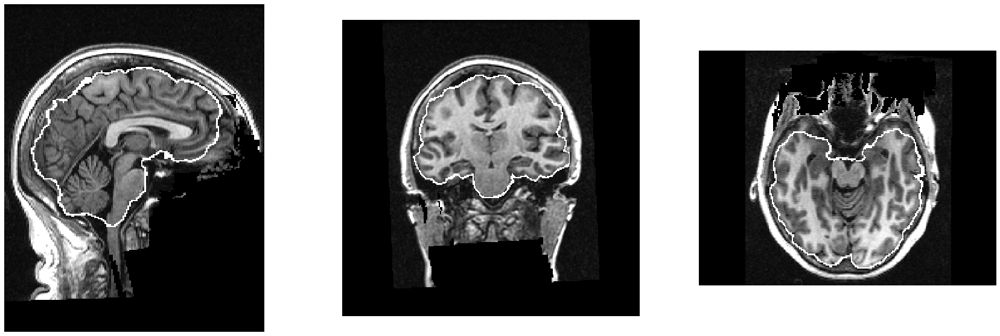

sub-08_ses-retest_T1w_brain_overlay.nii.gz


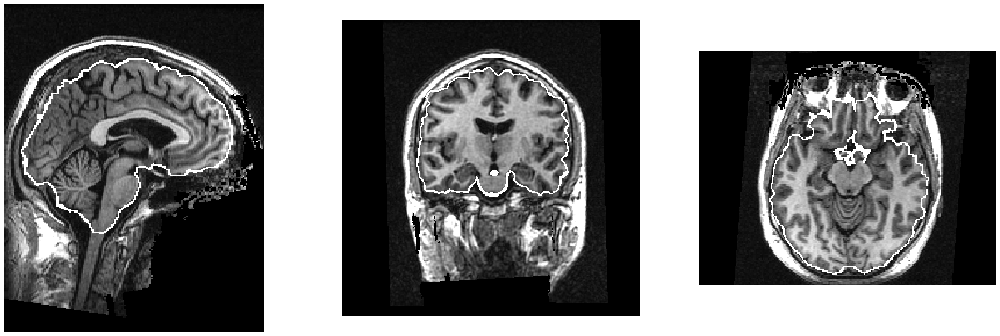

sub-08_ses-test_T1w_brain_overlay.nii.gz


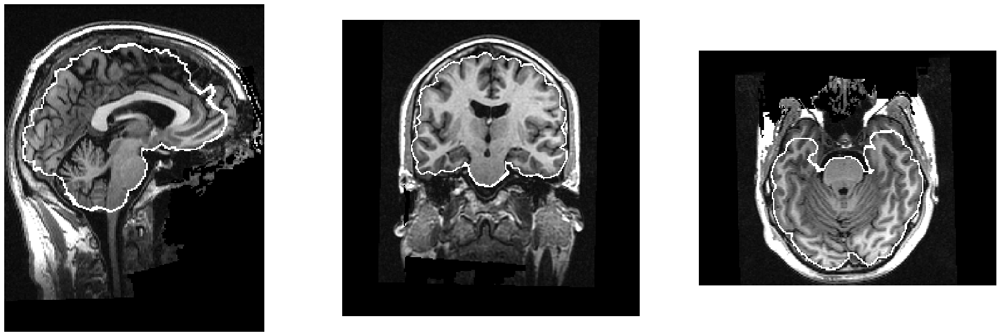

sub-09_ses-retest_T1w_brain_overlay.nii.gz


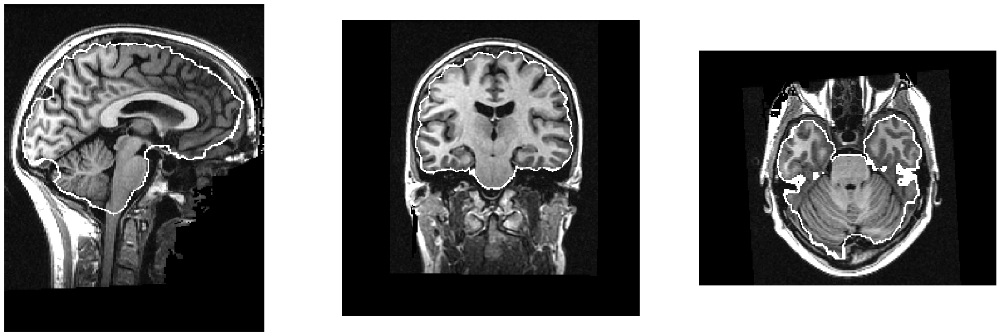

sub-09_ses-test_T1w_brain_overlay.nii.gz


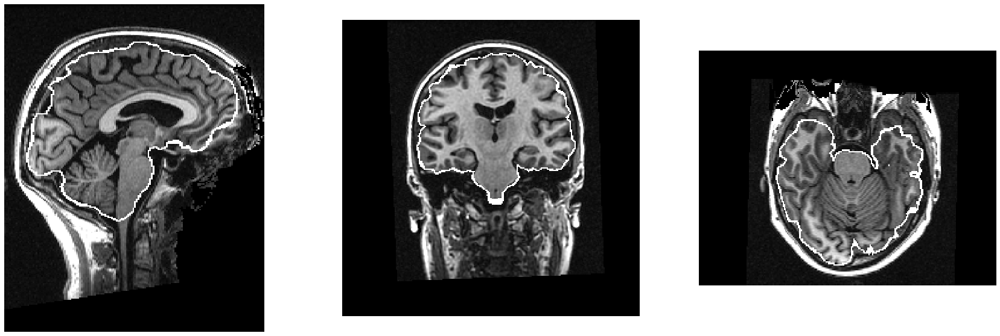

sub-10_ses-retest_T1w_brain_overlay.nii.gz


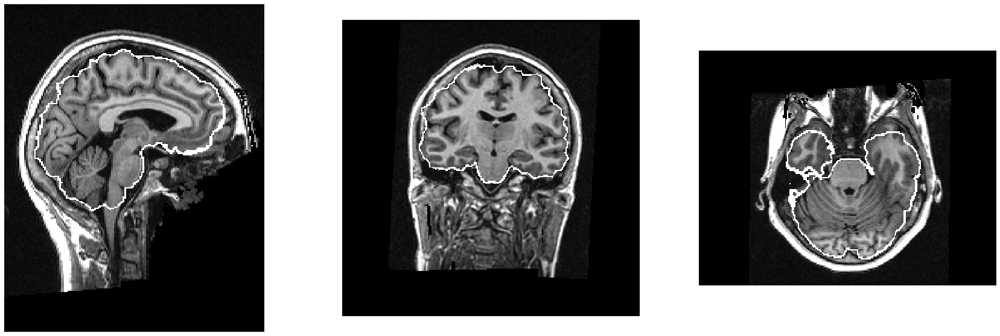

sub-10_ses-test_T1w_brain_overlay.nii.gz


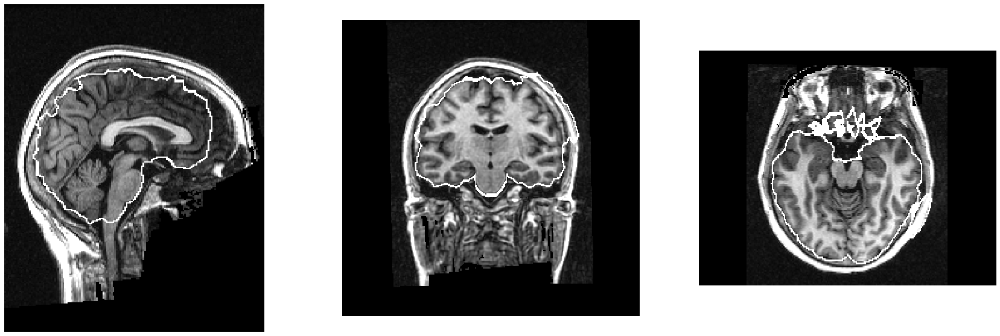

In [244]:
for overlay in sorted(outputdir.glob('sub-*overlay.nii.gz')):
    print(overlay.name)
    img = nib.load(str(overlay))
    sagital_slice = img.shape[0]//2
    coronal_slice = img.shape[1]//2
    axial_slice = img.shape[2]//2
    axial_aspect = img.header.get_zooms()[1]/img.header.get_zooms()[0]
    sagital_aspect = img.header.get_zooms()[2]/img.header.get_zooms()[1]
    coronal_aspect = img.header.get_zooms()[2]/img.header.get_zooms()[0]
    fig, axs = plt.subplots(1, 3, figsize=(30,10))
    axs[0].imshow(np.rot90(img.dataobj[sagital_slice,:,:]), cmap = 'gray', vmax = 1000, aspect = sagital_aspect)
    axs[1].imshow(np.rot90(img.dataobj[:,coronal_slice,:]), cmap = 'gray', vmax = 1000,  aspect = coronal_aspect)
    axs[2].imshow(np.rot90(img.dataobj[:,:,axial_slice]), cmap = 'gray', vmax = 1000,  aspect = axial_aspect)
    axs[0].axis('off')
    axs[1].axis('off')
    axs[2].axis('off')
    plt.show()

That's...really bad. Some of them might be fixed by lowering the -f threshold, but the last one has too large an outline, so it's unlikely that we'll be able to have one set of parameters that will work for everyone. We can try f = 0.3 to see if that helps

In [245]:
sj.command = list()
sj.command.append('module load fsl/6.0.1')
sj.command.append('bet {}/${{x}}/ses-test/anat/${{x}}_ses-test_T1w {}/${{x}}_ses-test_T1w_brain_f3 -o -R -f 0.3'.format(open_neuro_bids, outputdir))
sj.command.append('bet {}/${{x}}/ses-retest/anat/${{x}}_ses-retest_T1w {}/${{x}}_ses-retest_T1w_brain_f3 -o -R -f 0.3'.format(open_neuro_bids, outputdir))

In [246]:
sj.WriteSlurmFile()

'bet.srun'

In [247]:
sj.SubmitSlurmFile()

Submitted batch job 12050122



'12050122'

In [248]:
slurmpy.WaitUntilComplete(12050122)

Job complete


sub-01_ses-retest_T1w_brain_f3_overlay.nii.gz


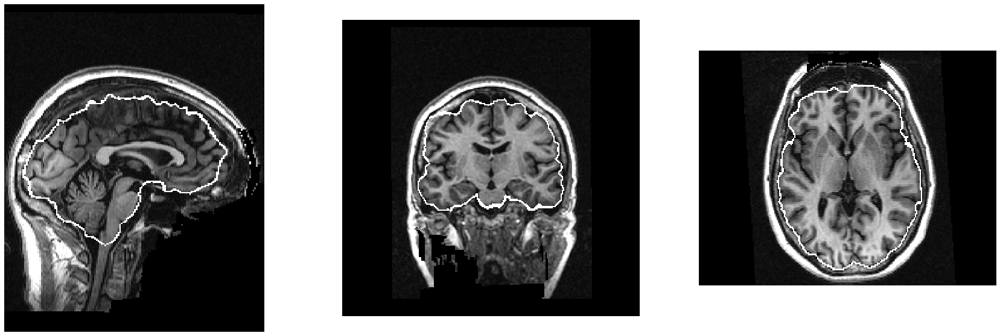

sub-01_ses-test_T1w_brain_f3_overlay.nii.gz


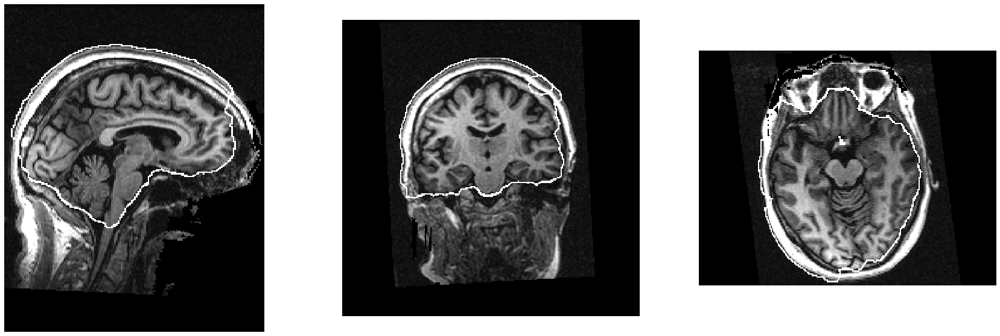

sub-02_ses-retest_T1w_brain_f3_overlay.nii.gz


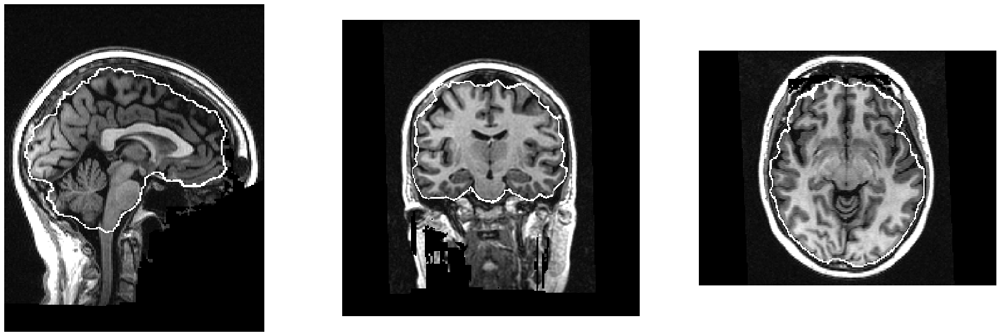

sub-02_ses-test_T1w_brain_f3_overlay.nii.gz


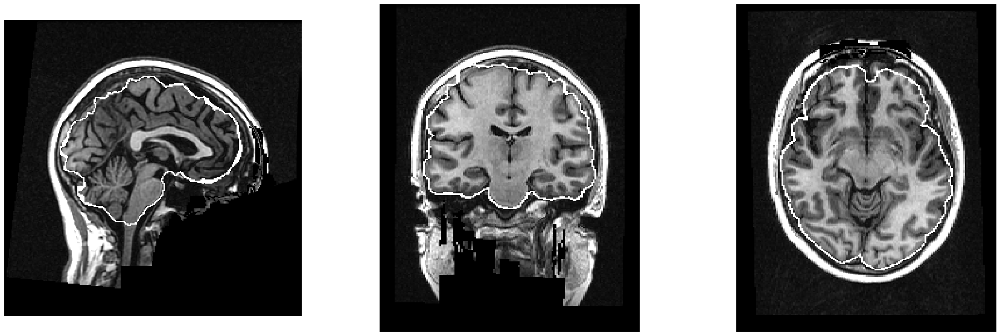

sub-03_ses-retest_T1w_brain_f3_overlay.nii.gz


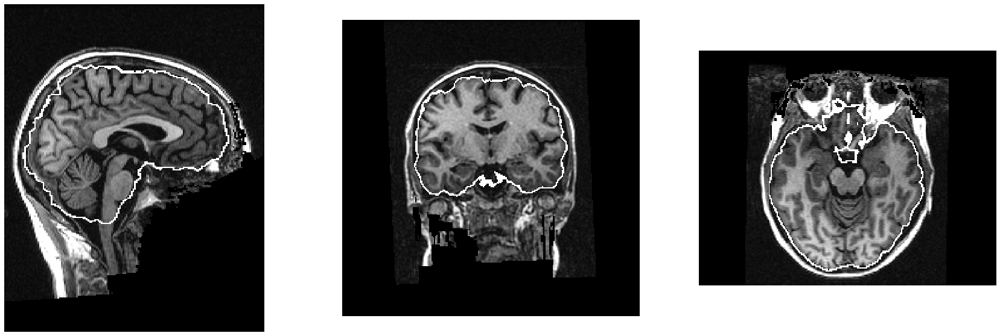

sub-03_ses-test_T1w_brain_f3_overlay.nii.gz


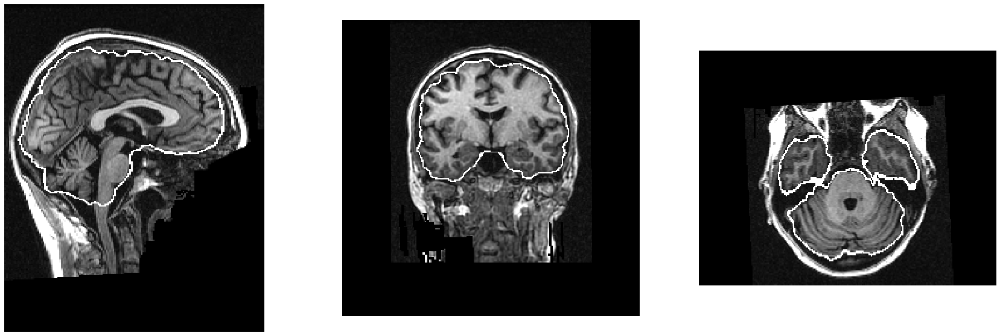

sub-04_ses-retest_T1w_brain_f3_overlay.nii.gz


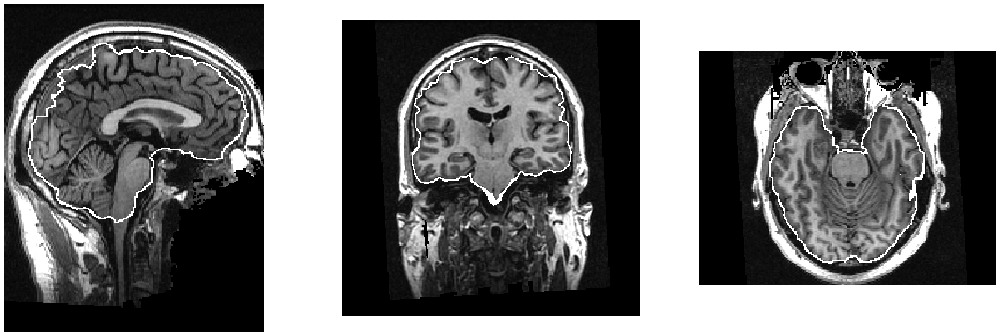

sub-04_ses-test_T1w_brain_f3_overlay.nii.gz


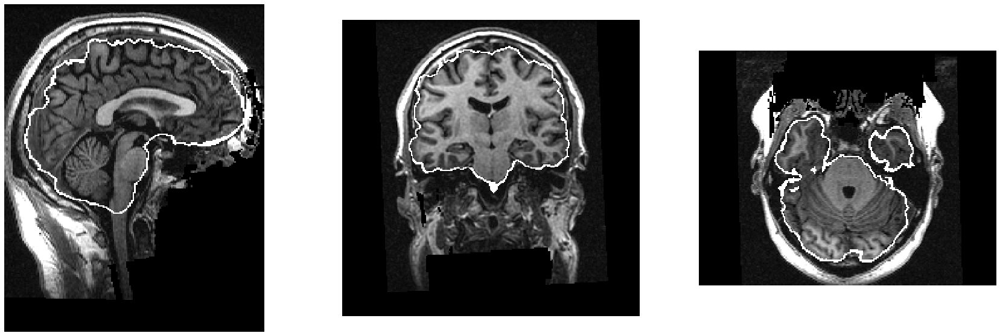

sub-05_ses-retest_T1w_brain_f3_overlay.nii.gz


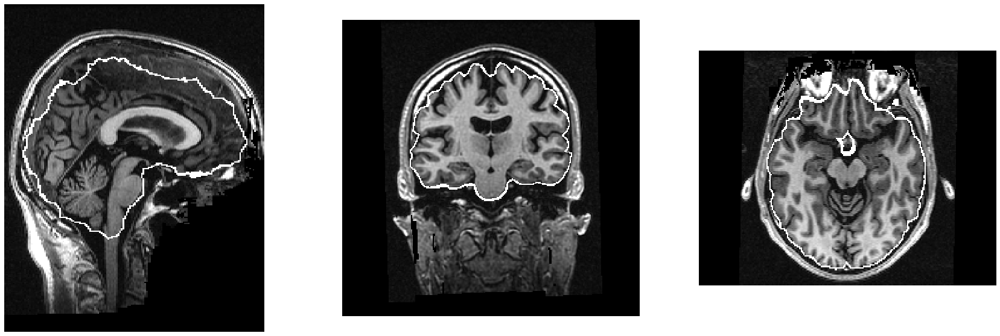

sub-05_ses-test_T1w_brain_f3_overlay.nii.gz


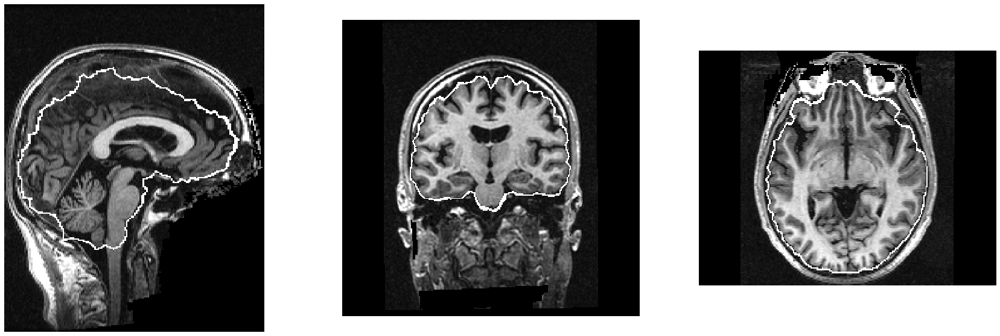

sub-06_ses-retest_T1w_brain_f3_overlay.nii.gz


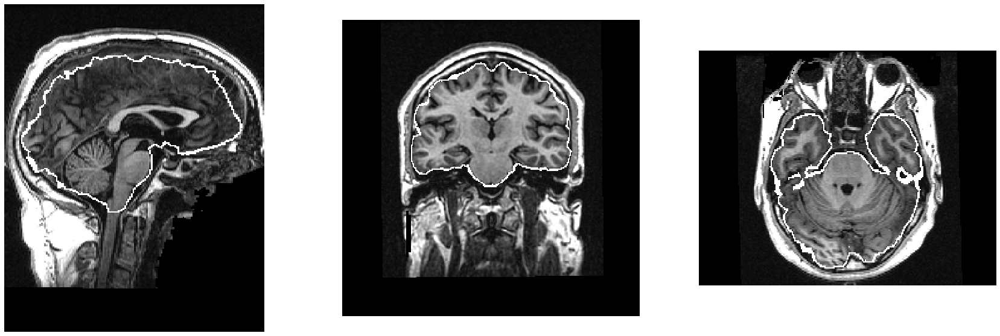

sub-06_ses-test_T1w_brain_f3_overlay.nii.gz


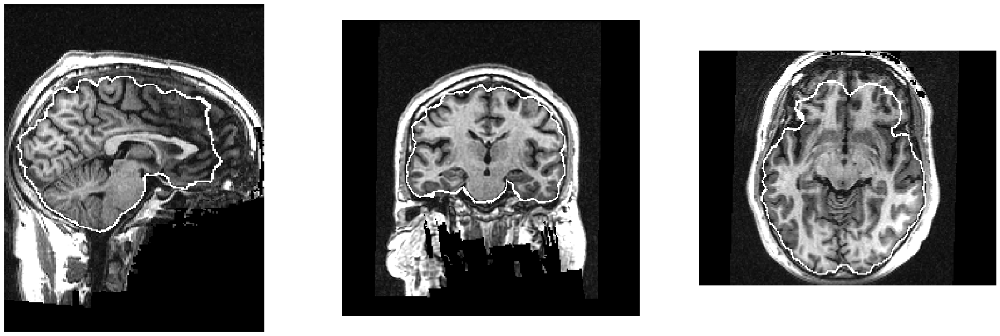

sub-07_ses-retest_T1w_brain_f3_overlay.nii.gz


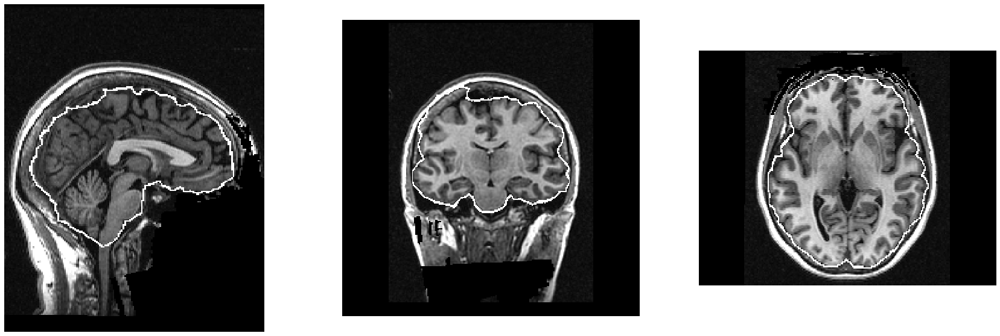

sub-07_ses-test_T1w_brain_f3_overlay.nii.gz


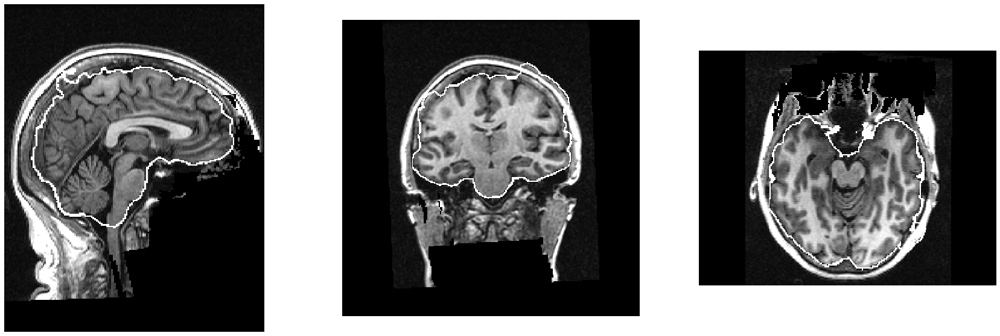

sub-08_ses-retest_T1w_brain_f3_overlay.nii.gz


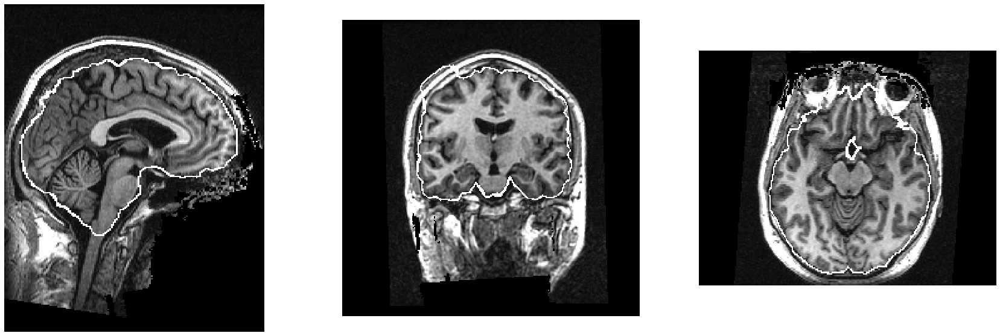

sub-08_ses-test_T1w_brain_f3_overlay.nii.gz


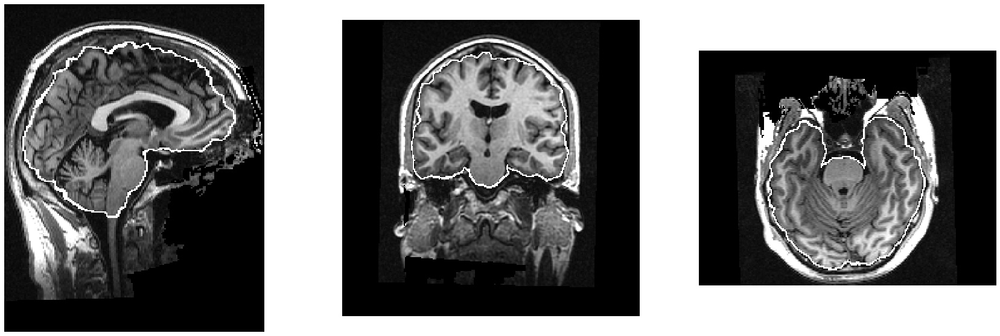

sub-09_ses-retest_T1w_brain_f3_overlay.nii.gz


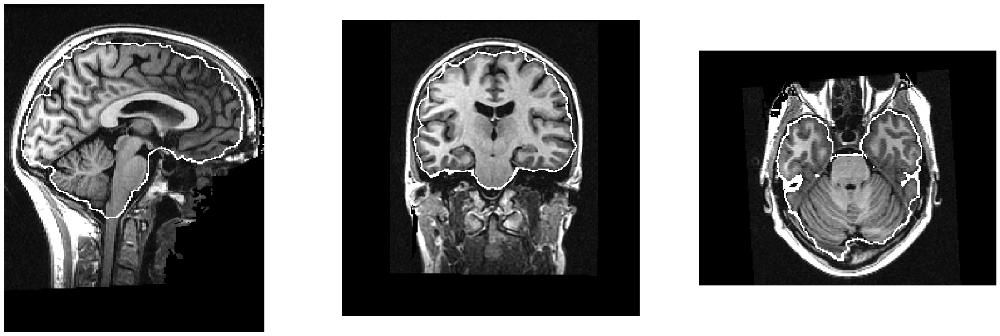

sub-09_ses-test_T1w_brain_f3_overlay.nii.gz


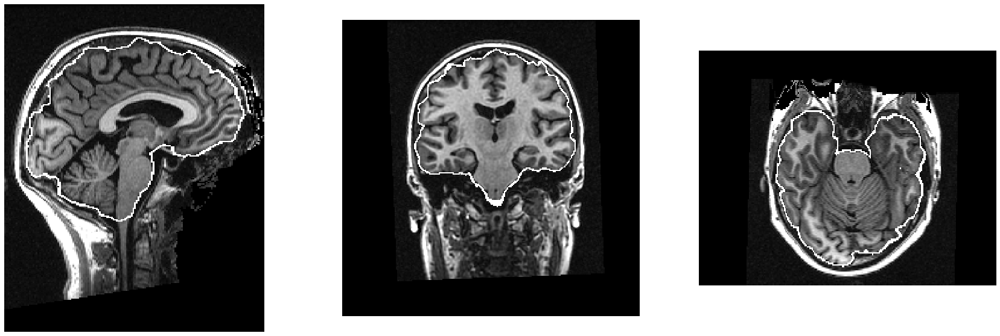

sub-10_ses-retest_T1w_brain_f3_overlay.nii.gz


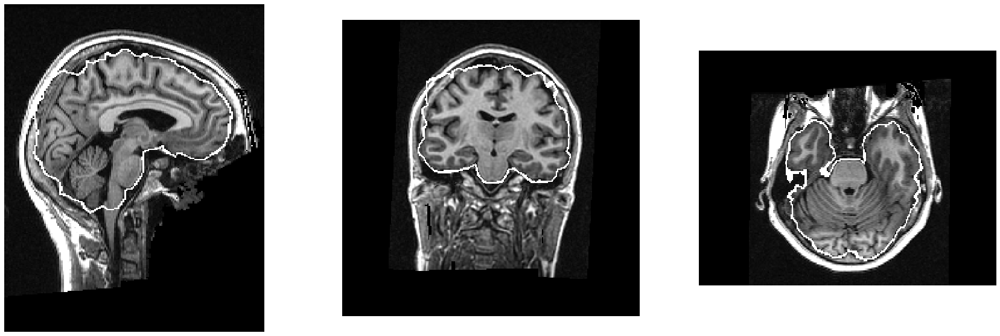

sub-10_ses-test_T1w_brain_f3_overlay.nii.gz


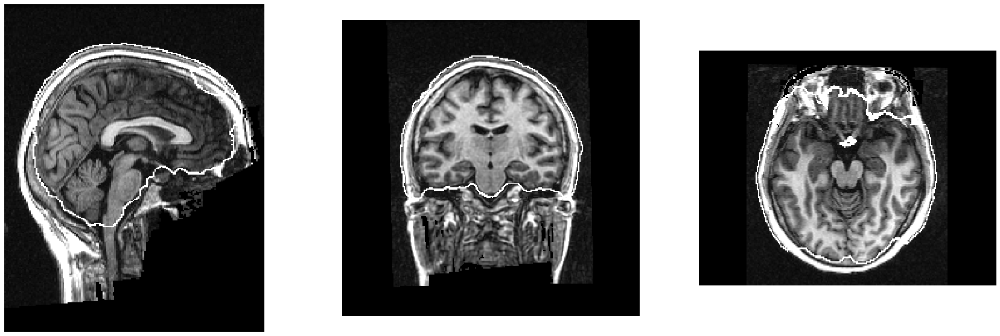

In [249]:
for overlay in sorted(outputdir.glob('sub-*f3_overlay.nii.gz')):
    print(overlay.name)
    img = nib.load(str(overlay))
    sagital_slice = img.shape[0]//2
    coronal_slice = img.shape[1]//2
    axial_slice = img.shape[2]//2
    axial_aspect = img.header.get_zooms()[1]/img.header.get_zooms()[0]
    sagital_aspect = img.header.get_zooms()[2]/img.header.get_zooms()[1]
    coronal_aspect = img.header.get_zooms()[2]/img.header.get_zooms()[0]
    fig, axs = plt.subplots(1, 3, figsize=(30,10))
    axs[0].imshow(np.rot90(img.dataobj[sagital_slice,:,:]), cmap = 'gray', vmax = 1000, aspect = sagital_aspect)
    axs[1].imshow(np.rot90(img.dataobj[:,coronal_slice,:]), cmap = 'gray', vmax = 1000,  aspect = coronal_aspect)
    axs[2].imshow(np.rot90(img.dataobj[:,:,axial_slice]), cmap = 'gray', vmax = 1000,  aspect = axial_aspect)
    axs[0].axis('off')
    axs[1].axis('off')
    axs[2].axis('off')
    plt.show()

That's better for some of them, worse for others. Making this work would involve a lot of fine tuning of individual subjects. Is there an alternative to bet? Of course there are alternatives, one is fsl_anat.

In [288]:
%%bash --no-raise-error
module load fsl/6.0.1
fsl_anat

Usage: fsl_anat [options] -i <structural image>
       fsl_anat [options] -d <existing anat directory>
 
Arguments (You may specify one or more of):
  -i <strucural image>         filename of input image (for one image only)
  -d <anat dir>                directory name for existing .anat directory where this script will be run in place
  -o <output directory>        basename of directory for output (default is input image basename followed by .anat)
  --clobber                    if .anat directory exist (as specified by -o or default from -i) then delete it and make a new one
  --strongbias                 used for images with very strong bias fields
  --weakbias                   used for images with smoother, more typical, bias fields (default setting)
  --noreorient                 turn off step that does reorientation 2 standard (fslreorient2std)
  --nocrop                     turn off step that does automated cropping (robustfov)
  --nobias                     turn off steps tha

This does a lot more than bet does, including bias field correction and registration. Note that by default it does the fslreorient2std and robustfov steps we already discussed. Interestingly the information here contradicts the defaults on the web page: instead of having both --strongbias and --weakbias, with --weakbias as the default, they have one parameter --weakbias, with strong bias as the default. If your mprage was prescan normalized, then you can turn off bias correction altogether. We'll just go with the defaults, whatever they may be.

In [255]:
sj.command = list()
sj.command.append('module load fsl/6.0.1')
sj.command.append('fsl_anat -i {}/${{x}}/ses-test/anat/${{x}}_ses-test_T1w -o {}/${{x}}_ses-test'.format(open_neuro_bids, outputdir))
sj.command.append('fsl_anat -i {}/${{x}}/ses-retest/anat/${{x}}_ses-retest_T1w -o {}/${{x}}_ses-retest'.format(open_neuro_bids, outputdir))
sj.jobname = 'fsl_anat'
sj.WriteSlurmFile()
sj.SubmitSlurmFile()

Submitted batch job 12050467



'12050467'

In [257]:
sj.ShowStatus()

COMPLETED 10


In [258]:
sj.ShowOutput()

slurm-12050467_0.out
Mon Jun  1 16:57:40 PDT 2020
Reorienting to standard orientation
Mon Jun  1 16:57:46 PDT 2020
Automatically cropping the image
Starting Single Image Segmentation
T1-weighted image
Imagesize : 256 x 156 x 170
Pixelsize : 1 x 1.29959 x 1

1 5.51745
2 6.03309
3 6.43133
KMeans Iteration 0
KMeans Iteration 1
KMeans Iteration 2
KMeans Iteration 3
KMeans Iteration 4
KMeans Iteration 5
KMeans Iteration 6
KMeans Iteration 7
KMeans Iteration 8
KMeans Iteration 9
KMeans Iteration 10
KMeans Iteration 11
KMeans Iteration 12
KMeans Iteration 13
KMeans Iteration 14
Tanaka Iteration 0 bias field 10
Tanaka-inner-loop-iteration=0 MRFWeightsTotal=1.07608e+07 beta=0.02
Tanaka-inner-loop-iteration=1 MRFWeightsTotal=1.08789e+07 beta=0.02
Tanaka-inner-loop-iteration=2 MRFWeightsTotal=1.08813e+07 beta=0.02
Tanaka-inner-loop-iteration=3 MRFWeightsTotal=1.08814e+07 beta=0.02
Tanaka-inner-loop-iteration=4 MRFWeightsTotal=1.08814e+07 beta=0.02
 CLASS 1 MEAN 181.026 STDDEV 131.874 CLASS 2 MEAN

In [260]:
print(sj.JobInfo())

               JobID                   JobName  Partition      State    Elapsed     MaxRSS 
-------------------- ------------------------- ---------- ---------- ---------- ---------- 
          12050467_0                  fsl_anat      short  COMPLETED   00:51:28            
    12050467_0.batch                     batch             COMPLETED   00:51:28    814396K 
   12050467_0.extern                    extern             COMPLETED   00:51:28          0 
          12050467_1                  fsl_anat      short  COMPLETED   00:40:23            
    12050467_1.batch                     batch             COMPLETED   00:40:23    823308K 
   12050467_1.extern                    extern             COMPLETED   00:40:23          0 
          12050467_2                  fsl_anat      short  COMPLETED   00:40:10            
    12050467_2.batch                     batch             COMPLETED   00:40:10    814344K 
   12050467_2.extern                    extern             COMPLETED   00:40:10 

That shows that fsl_anat took between 18 and 26 minutes (remember each step ran two images through). What files are created?

In [262]:
ls {outputdir}/sub-01_ses-retest.anat/

MNI152_T1_2mm_brain_mask_dil1.nii.gz  T1_orig2roi.mat
MNI_to_T1_nonlin_field.nii.gz         T1_orig2std.mat
T1.nii.gz                             T1_roi.log
T12std_skullcon.mat                   T1_roi2nonroi.mat
T1_biascorr.nii.gz                    T1_roi2orig.mat
T1_biascorr_bet_skull.nii.gz          T1_std2orig.mat
T1_biascorr_brain.nii.gz              T1_subcort_seg.nii.gz
T1_biascorr_brain_mask.nii.gz         T1_to_MNI_lin.mat
T1_biascorr_to_std_sub.mat            T1_to_MNI_lin.nii.gz
T1_fast_bias.nii.gz                   T1_to_MNI_nonlin.nii.gz
T1_fast_mixeltype.nii.gz              T1_to_MNI_nonlin.txt
T1_fast_pve_0.nii.gz                  T1_to_MNI_nonlin_coeff.nii.gz
T1_fast_pve_1.nii.gz                  T1_to_MNI_nonlin_field.nii.gz
T1_fast_pve_2.nii.gz                  T1_to_MNI_nonlin_jac.nii.gz
T1_fast_pveseg.nii.gz                 T1_vols.txt
T1_fast_restore.nii.gz                first_results/
T1_fast_seg.nii.gz                    lesionmask.nii.gz
T1_fullfov.nii.gz     

We want to look at the 'biascorr' files, specifically the 'T1_biascorr' and 'T1_biascorr_brain_mask' files. We don't have overlay images to view, but we can just plot the mask on top of the bias-corrected T1. We need to add an "alpha" parameter to the mask to indicate the degree of transparency.

/home/jolinda/lcni/class9out/sub-01_ses-retest.anat


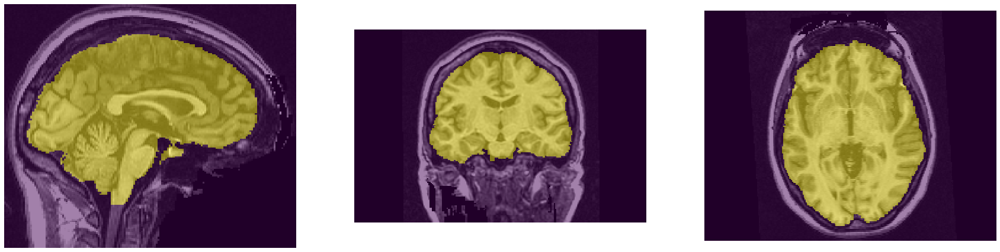

/home/jolinda/lcni/class9out/sub-01_ses-test.anat


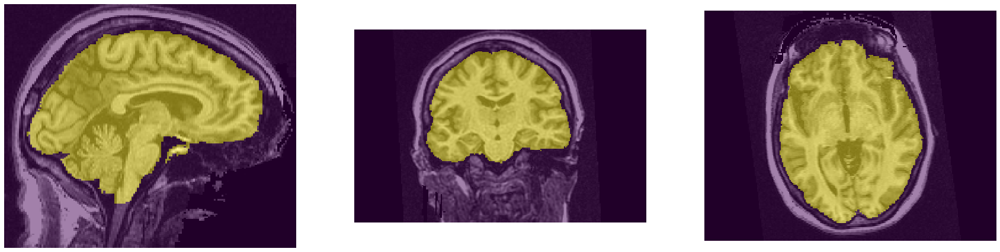

/home/jolinda/lcni/class9out/sub-02_ses-retest.anat


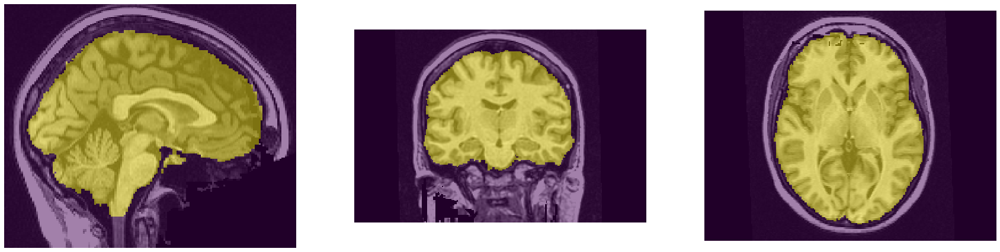

/home/jolinda/lcni/class9out/sub-02_ses-test.anat


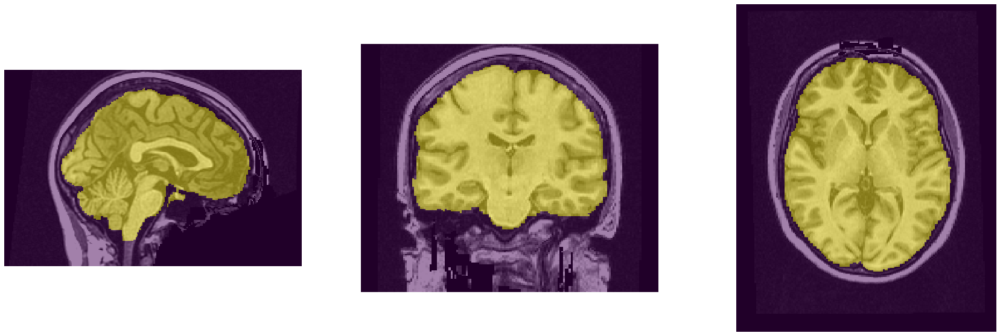

/home/jolinda/lcni/class9out/sub-03_ses-retest.anat


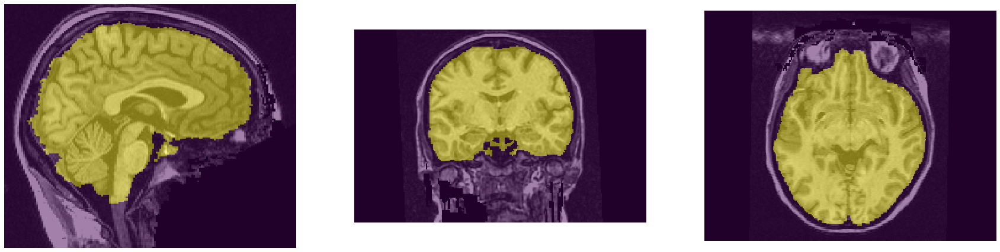

/home/jolinda/lcni/class9out/sub-03_ses-test.anat


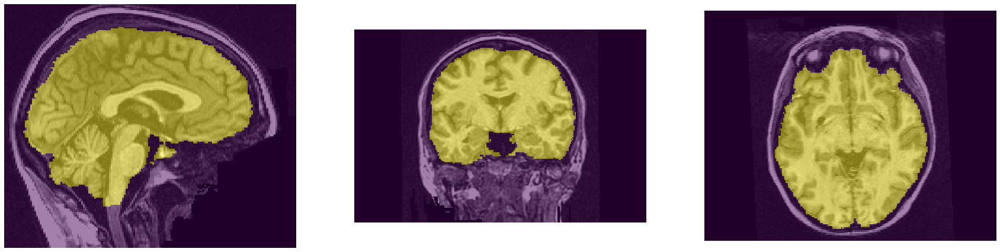

/home/jolinda/lcni/class9out/sub-04_ses-retest.anat


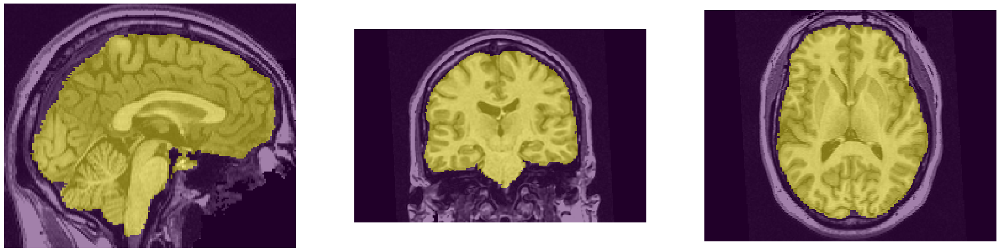

/home/jolinda/lcni/class9out/sub-04_ses-test.anat


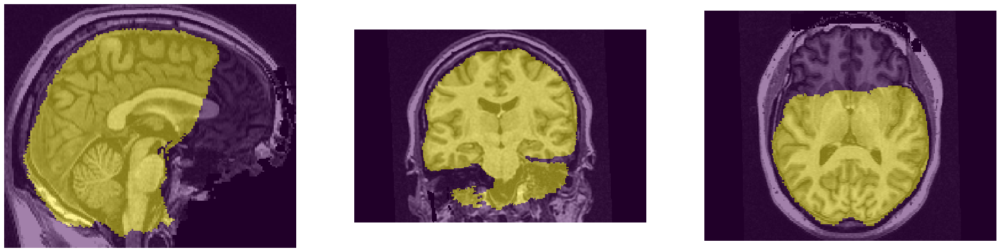

/home/jolinda/lcni/class9out/sub-05_ses-retest.anat


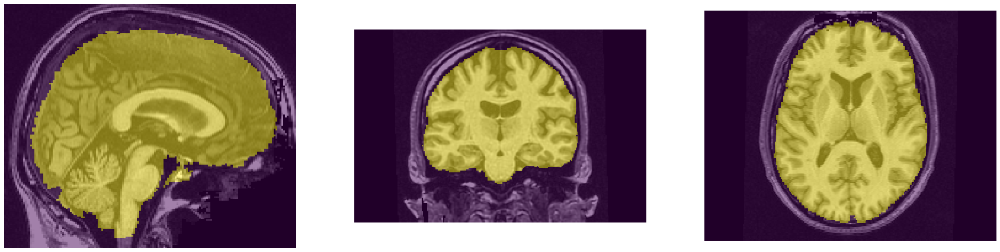

/home/jolinda/lcni/class9out/sub-05_ses-test.anat


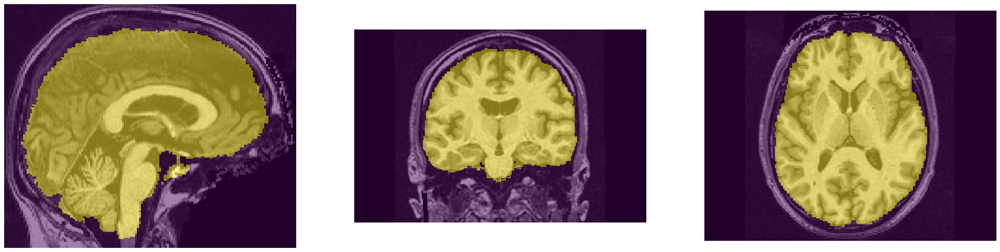

/home/jolinda/lcni/class9out/sub-06_ses-retest.anat


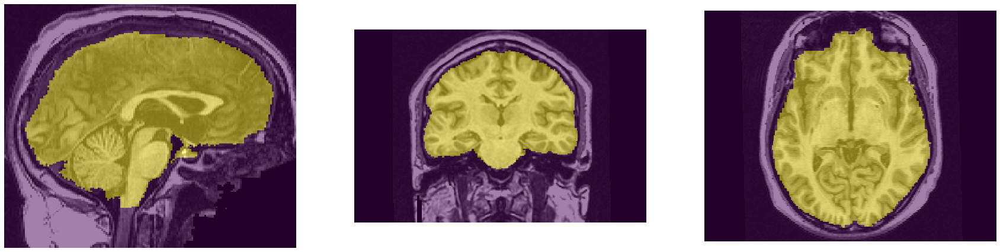

/home/jolinda/lcni/class9out/sub-06_ses-test.anat


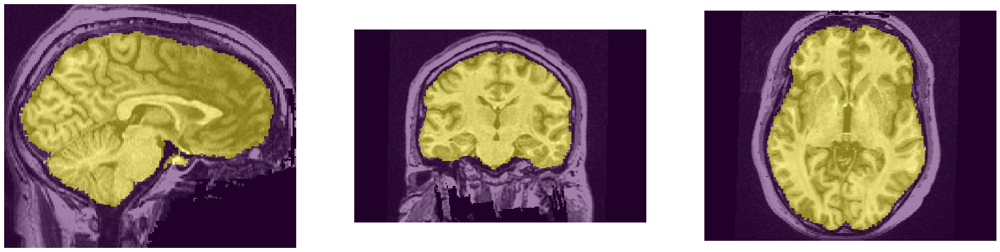

/home/jolinda/lcni/class9out/sub-07_ses-retest.anat


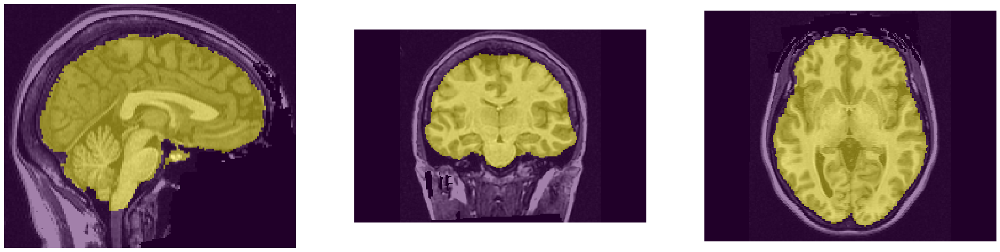

/home/jolinda/lcni/class9out/sub-07_ses-test.anat


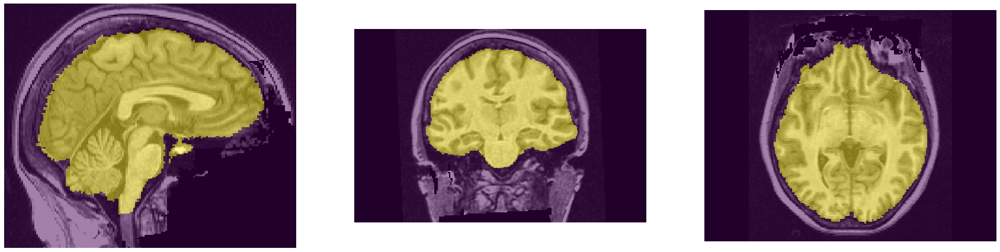

/home/jolinda/lcni/class9out/sub-08_ses-retest.anat


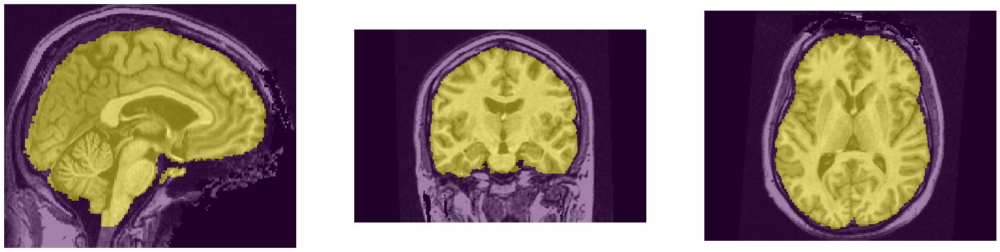

/home/jolinda/lcni/class9out/sub-08_ses-test.anat


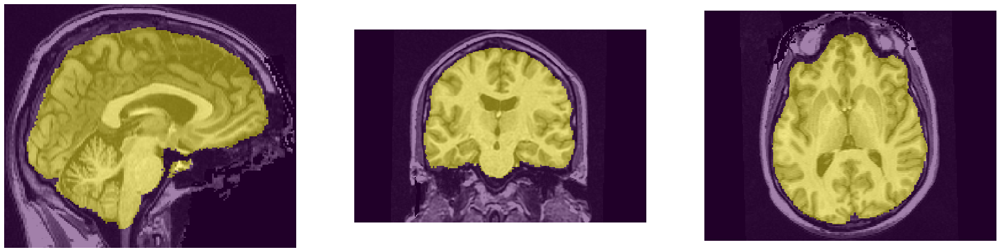

/home/jolinda/lcni/class9out/sub-09_ses-retest.anat


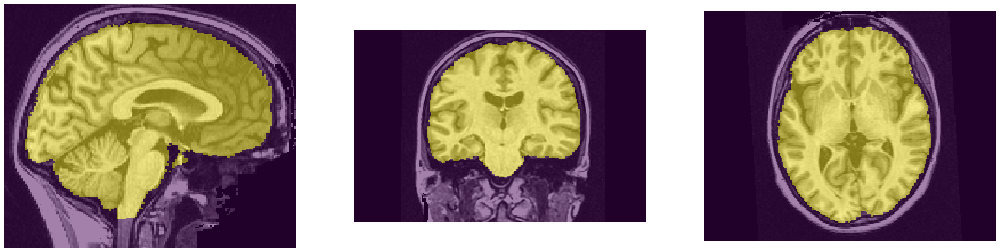

/home/jolinda/lcni/class9out/sub-09_ses-test.anat


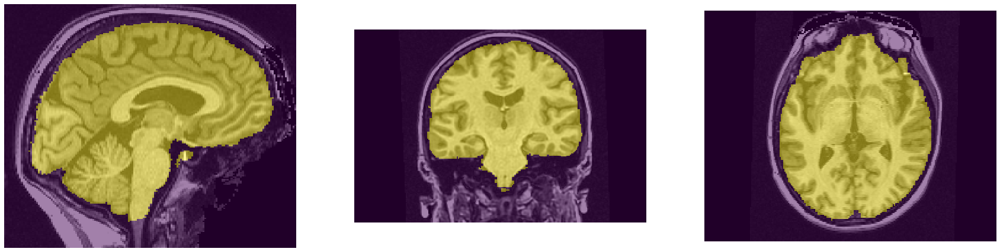

/home/jolinda/lcni/class9out/sub-10_ses-retest.anat


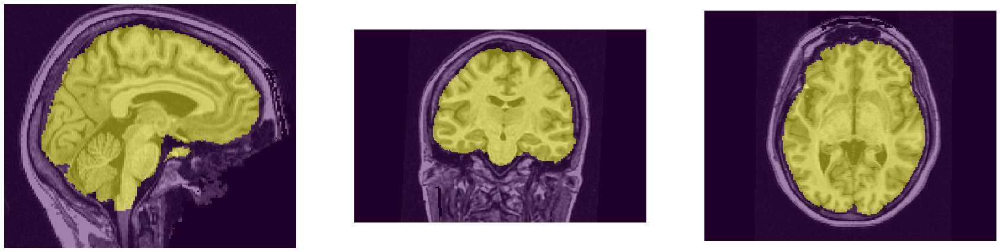

/home/jolinda/lcni/class9out/sub-10_ses-test.anat


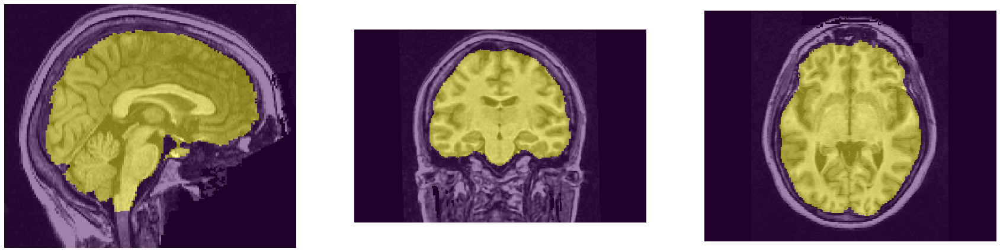

In [278]:
for anat in sorted(outputdir.glob('*.anat')):
    print(anat)
    t1 = nib.load(str(anat / 'T1_biascorr.nii.gz'))
    mask = nib.load(str(anat / 'T1_biascorr_brain_mask.nii.gz'))
    
    sagital_slice = t1.shape[0]//2
    coronal_slice = t1.shape[1]//2
    axial_slice = t1.shape[2]//2
    axial_aspect = t1.header.get_zooms()[1]/t1.header.get_zooms()[0]
    sagital_aspect = t1.header.get_zooms()[2]/t1.header.get_zooms()[1]
    coronal_aspect = t1.header.get_zooms()[2]/t1.header.get_zooms()[0]
    
    fig, axs = plt.subplots(1, 3, figsize=(30,10))
    axs[0].imshow(np.rot90(t1.dataobj[sagital_slice,:,:]), aspect = sagital_aspect, cmap = 'gray', vmax = 1000)
    axs[1].imshow(np.rot90(t1.dataobj[:,coronal_slice,:]), aspect = coronal_aspect, cmap = 'gray', vmax = 1000)
    axs[2].imshow(np.rot90(t1.dataobj[:,:,axial_slice]), aspect = axial_aspect, cmap = 'gray', vmax = 1000)
    
    axs[0].imshow(np.rot90(mask.dataobj[sagital_slice,:,:]), aspect = sagital_aspect, alpha = 0.5)
    axs[1].imshow(np.rot90(mask.dataobj[:,coronal_slice,:]), aspect = coronal_aspect, alpha = 0.5)
    axs[2].imshow(np.rot90(mask.dataobj[:,:,axial_slice]), aspect = axial_aspect, alpha = 0.5)
    
    axs[0].axis('off')
    axs[1].axis('off')
    axs[2].axis('off')
    plt.show()

MUCH better, but there was still one failure, and it was a big one. Always, always look! Something about that one makes me think it's a registration problem.

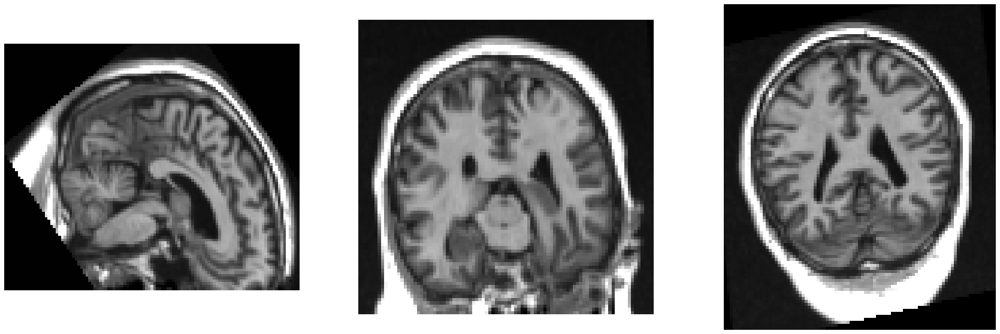

In [296]:
t1 = nib.load(str(outputdir / 'sub-04_ses-test.anat' / 'T1_to_MNI_lin.nii.gz'))

sagital_slice = t1.shape[0]//2
coronal_slice = t1.shape[1]//2
axial_slice = t1.shape[2]//2
axial_aspect = t1.header.get_zooms()[1]/t1.header.get_zooms()[0]
sagital_aspect = t1.header.get_zooms()[2]/t1.header.get_zooms()[1]
coronal_aspect = t1.header.get_zooms()[2]/t1.header.get_zooms()[0]


fig, axs = plt.subplots(1, 3, figsize=(30,10))
axs[0].imshow(np.rot90(t1.dataobj[sagital_slice,:,:]), aspect = sagital_aspect, cmap = 'gray', vmax = 1000)
axs[1].imshow(np.rot90(t1.dataobj[:,coronal_slice,:]), aspect = coronal_aspect, cmap = 'gray', vmax = 1000)
axs[2].imshow(np.rot90(t1.dataobj[:,:,axial_slice]), aspect = axial_aspect, cmap = 'gray', vmax = 1000)

axs[0].axis('off')
axs[1].axis('off')
axs[2].axis('off')
plt.show()

Yep, that's our problem. Most of the wonky registrations I've seen were fixed by running 'fslreorient2std' first. This one wasn't. We'll come back to this another day and see if we can find out what went wrong.

# BONUS: Using AutoAlign scouts to check longitudinal data
You have a bunch of subjects with multiple runs. Is there an easy way to tell if the data from run2 is really the same persone as run1? Yes, use your autoalign data!  We want to use the MPR folders -- these should be exactly the same between sessions, and there are only three files in each so they're easy to deal with.

In [235]:
subjects_to_test = sorted(mydicoms.glob('*003_*'))

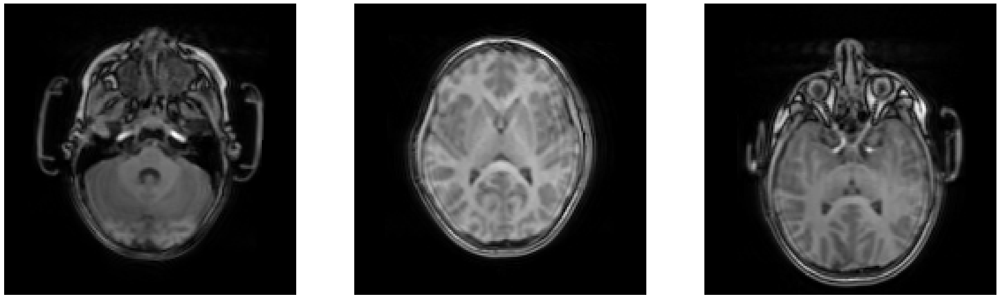

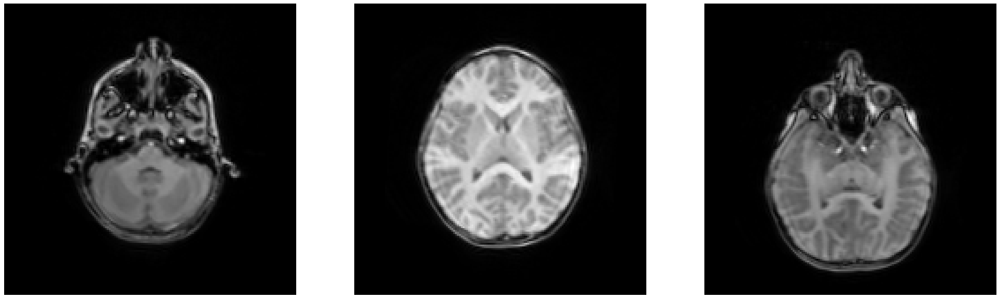

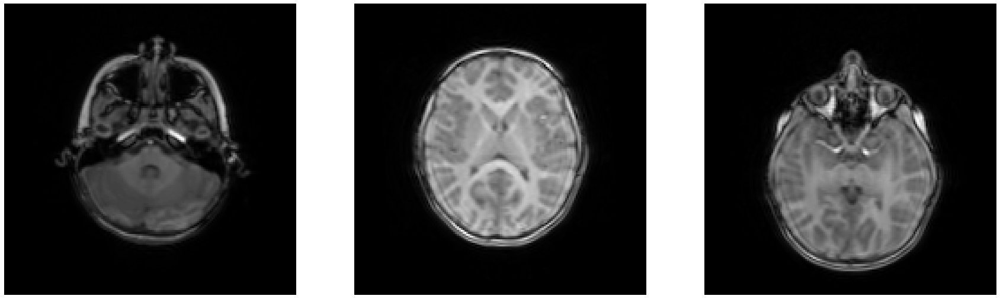

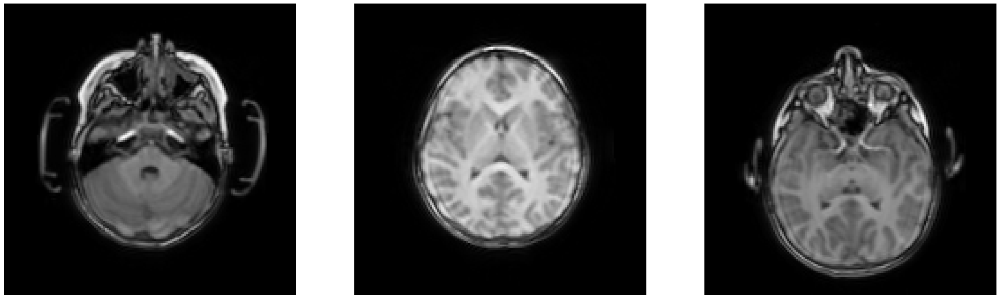

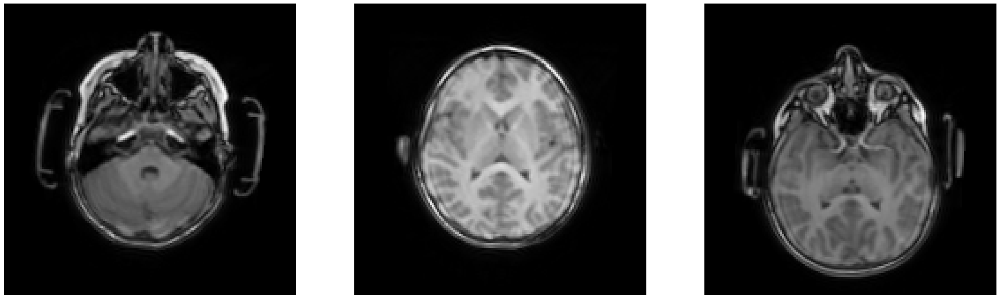

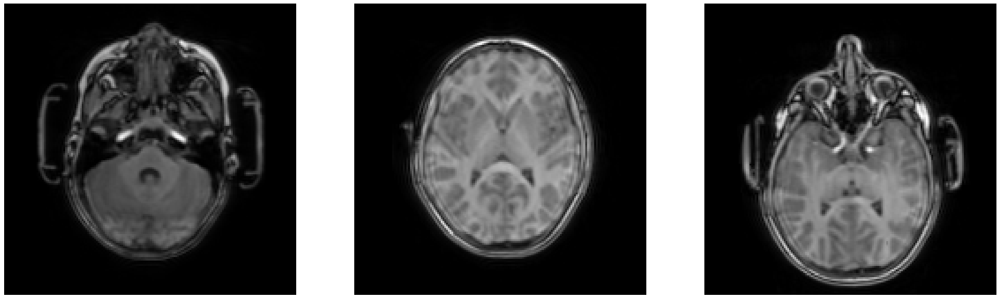

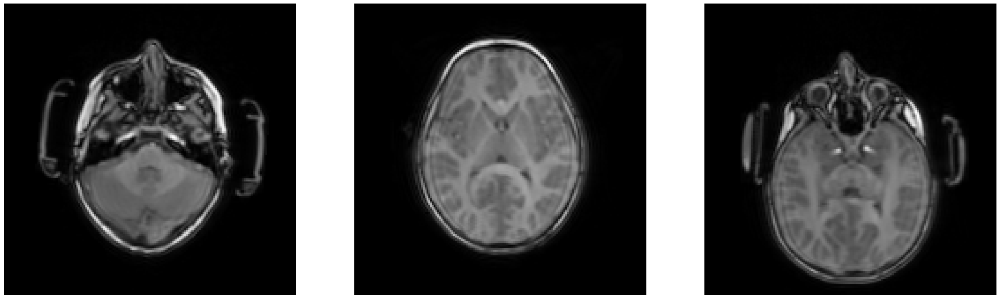

In [236]:
for subject in subjects_to_test:
    scouts = sorted(subject.glob('Series_4_AAHScout_MPR_tra/*'))
    fig, axs = plt.subplots(1, len(scouts), figsize=(30,10))
    for i,dicom in enumerate(scouts):
        axs[i].imshow(pydicom.dcmread(str(dicom)).pixel_array, cmap = 'gray')
        axs[i].axis('off')
    plt.show()